# Mach cone

Data plotting for the initial simulation results presentation. Scientific case of NorSat-1 satellite in a supersonic plasma flow.

Group 3: ***Aurora***
 - Doyeon Kim
 - Michał Jan Odorczuk
 - Rachel Knutsen Stiansen
 - Shunsuke Kawamura
 - Taito Taniguchi

### Description

The simulation parameters were set to:

| Parameter | default|
| :--- | ---:|
| Plasma density | $10^5$ #/cc|
| Electron temperature | $1000$ K|
| Ion temperature | $750$ K|
| Ion to electron mass ratio | $1000$|

with plasma flow in the positive x direction. All plots include the information on the used the Mach number and the magnetic field orientation and strength. All simulation used [EMSES](https://www.energy.kyoto-u.ac.jp/gcoe/en/emses/aboutemses.htm) software on CAMPHOR supercomputer from [Kyoto University](https://www.kyoto-u.ac.jp/ja).

The simulations used a mesh of $160 \times 160 \times 154$, with the grid width of $0.5$ cm. The mesh included a simplified model of the NorSat-1 satellite consisting of 9 elements:
 - Main body - cuboid stretching from $(59,74,63)$ to $(80,86,93)$,
 - Solar panel 1 - cuboid stretching from $(59, 62, 63)$ to $(60, 74, 93)$,
 - Solar panel 2 - cuboid stretching from $(59, 86, 63)$ to $(60, 98, 93)$,
 - Langmuir probe rod 1 - cylinder of radius $0.5$, aligned with the y-axis, stretching from $(80, 51, 63)$ to $(80, 109, 63)$,
 - Langmuir probe rod 2 - cylinder of radius $0.5$, aligned with the y-axis, stretching from $(80, 51, 93)$ to $(80, 109, 93)$,
 - Langmuir probe ball 1 - sphere of radius $0.5$, centered at $(80, 110, 63)$,
 - Langmuir probe ball 2 - sphere of radius $0.5$, centered at $(80, 110, 93)$,
 - Langmuir probe ball 3 - sphere of radius $0.5$, centered at $(80, 50, 63)$,
 - Langmuir probe ball 4 - sphere of radius $0.5$, centered at $(80, 50, 93)$,

## Imports

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
from os import listdir
import re

## Data

All the datafiles should be located in `./res/data/` and their names should be in the format `data_B<x>_Ma<y>_<z>uT.csv`, where `<x>` is the direction of the magnetic field, `<y>` is the Mach number of the flow, and `<z>` is the magnetic field strength in microteslas. The files are expected to be in the format as exported from Paraview, with at least six columns:

| Variable name | Type | Description |
| :--- | :--- | ---: |
| `Structured Coordinates:0` | integer | Point coordinate in the x-direction |
| `Structured Coordinates:1` | integer | Point coordinate in the y-direction |
| `Structured Coordinates:2` | integer | Point coordinate in the z-direction |
| `nd1p` | floating point number | Normalised number density of electrons |
| `nd2p` | floating point number | Normalised number density of ions |
| `phisp` | floating point number | Normalised electric field potential |

In [2]:
data_dir = "./res/data/"
dirs = listdir(data_dir)
dfs = {}
files = [file for file in dirs if file[:4] == "data"]
for file in files:
    label = re.search("^data_(.*)\.csv$", file).group(1)
    dfs[label] = pd.read_csv(data_dir + file)
    print("simulation with parameters ", label, " included")

simulation with parameters  Bz_Ma6.4_50uT  included
simulation with parameters  Bx_Ma0.2_0uT  included
simulation with parameters  Bx_Ma2.0_70uT  included
simulation with parameters  Bx_Ma4.0_50uT  included
simulation with parameters  Bx_Ma2.0_100uT  included
simulation with parameters  Bz_Ma0.2_50uT  included
simulation with parameters  Bx_Ma2.0_50uT  included
simulation with parameters  Bx_Ma2.0_0uT  included
simulation with parameters  Bx_Ma0.2_50uT  included
simulation with parameters  Bx_Ma6.4_50uT  included
simulation with parameters  Bx_Ma4.0_0uT  included
simulation with parameters  Bz_Ma2.0_50uT  included
simulation with parameters  Bx_Ma6.4_0uT  included


## Electric field analysis

Visualisation of electric field in x-y axis over a slice through the middle of the satellite. Magnetic field is aligned with z axis and moves along with the plasma at $\text{Ma} = 2.0$. Relative movement of the magnetic field creates an electric potential in y direction forming a virtual $\vec{E} \times \vec{B}$ drift. As the electrons are much more mobile, the probe receives much more negative charge, thus the negatively biased potential near the probe.

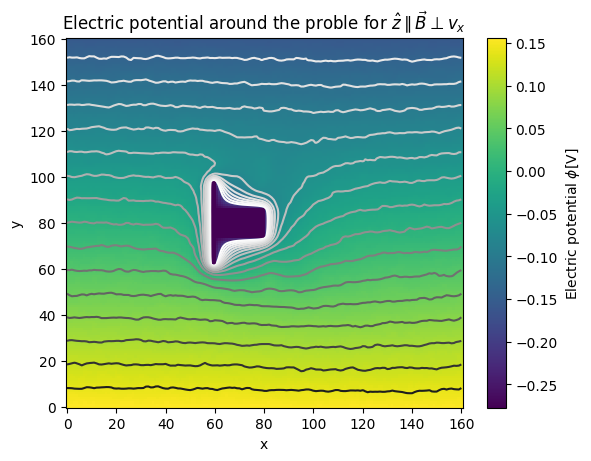

In [3]:
df = pd.read_csv("res/data/data_Bz_Ma2.0_50uT.csv")
df = df[df["Structured Coordinates:2"]==80]
xs = df["Structured Coordinates:0"]
ys = df["Structured Coordinates:1"]
phi = df["phisp"]
grid_x = np.unique(df["Structured Coordinates:0"])
grid_y = np.unique(df["Structured Coordinates:1"])

X, Y = np.meshgrid(grid_x, grid_y)
PHI_SCALE = 5.11e-3
PHI = phi.to_numpy().reshape(X.shape) * PHI_SCALE

fig, ax = plt.subplots()
im = ax.pcolor(X, Y, PHI)
ax.contour(X, Y, PHI, np.arange(-0.2, 0.2, 0.02), cmap=plt.get_cmap("Greys"))

fig.colorbar(im, ax=ax, label="Electric potential $\\phi$[V]")
plt.title("Electric potential around the proble for $\\hat{z}\\parallel\\vec{B}\\bot v_x$")
plt.xlabel("x")
plt.ylabel("y");

## Background for plots

Displaying field data as a background for the plot.

 - `df` - dataframe containing the background data. It has to include three coordinates `Structured Coordinates:0`, `Structured Coordinates:1` and `Structured Coordinates:2`, and the background field data under label given by attribute `field`.
 - `ax` - axis object for plotting,
 - `xlow` - lower limit of the plot in x-direction (`Structured Coordinates:0`),
 - `xhigh` - upper limit of the plot in x-direction (`Structured Coordinates:0`),
 - `ylow` - lower limit of the plot in y-direction (`Structured Coordinates:1`),
 - `yhigh` - upper limit of the plot in y-direction (`Structured Coordinates:1`),
 - `z` - z (`Structured Coordinates:1`) coordinate of the slicing plane,
 - `field` - field to be displayed as the background,
 - `steps` - number of contour levels to be displayed over the plot.

In [4]:
def background(df, ax, xlow, xhigh, ylow, yhigh, field, steps=10):
    x = df["Structured Coordinates:0"]
    y = df["Structured Coordinates:1"]
    z = df["Structured Coordinates:2"]
    df = df[(z==80)&(x>=xlow)&(x<=xhigh)&(y>=ylow)&(y<=yhigh)]
    phi = df[field]
    grid_x = np.unique(df["Structured Coordinates:0"])
    grid_y = np.unique(df["Structured Coordinates:1"])

    X, Y = np.meshgrid(grid_x, grid_y)
    PHI_SCALE = 5.11e-3
    PHI = phi.to_numpy().reshape(X.shape) * PHI_SCALE

    ax.pcolor(X, Y, PHI, cmap=plt.get_cmap("gray"))
    min_phi, max_phi = PHI.min(), PHI.max()
    ax.contour(X, Y, PHI, np.arange(min_phi, max_phi, (max_phi - min_phi) / steps), cmap=plt.get_cmap("gray"))


## Outer Mach cone

In [5]:
# mode = 0 (ions), 1 (electrons)
def outerCone(df, ax, field, mode = 0, N_average = 20, np_boundary=0.92, background_steps=10):
    if mode == 0:
        mode_label = "ion"
    if mode == 1:
        mode_label = "electron"
    else:
        mode_label = "electric potential"

    background(df, ax, 20, 160, 80, 160, field, background_steps)

    breaks = []

    mask = df["Structured Coordinates:2"] == 80
    xs = df["Structured Coordinates:0"][0]

    for z in range(70, 91, 1):
        for y in range(98, 160, 1):
            mask = (df["Structured Coordinates:1"]==y)&(df["Structured Coordinates:2"]==z)
            masked = df[mask]
            xs = masked["Structured Coordinates:0"]
            if mode == 0:
                ys = masked["nd2p"]
            if mode == 1:
                ys = masked["nd1p"]
            else:
                ys = masked['phisp']
                np_boundary = (ys.max() - ys.min()) * np_boundary + ys.min()
            ys = np.convolve(ys, np.ones(N_average), mode='same') / N_average
            below = (xs>N_average/2)&(ys<np_boundary)
            breaks.append([y, np.argmax(below)])
    breaks = np.array(breaks).T

    ax.scatter(breaks[1], breaks[0], s=2, label=f"Upstream drop of {mode_label} density below {np_boundary}", c='r')

    ax.set_title("Mach cone boundary from the solar panels")
    ax.set_xlabel("x position")
    ax.set_ylabel("y position")

    start, end = 60, 100
    breaks = breaks[:,(breaks[1]<end)&(breaks[1]>start)]

    A = np.vstack([breaks[1], np.ones(breaks.shape[1])]).T
    m, c = np.linalg.lstsq(A, breaks[0])[0]
    angle = np.arctan(m)
    Ma = 1 / np.sin( angle )
    print(label, angle, Ma)
    print(f"Based on the outer cone slope, Mach number is estimated to be {Ma:.2f}")
    xs = np.arange(start, end)
    ax.plot(xs, xs * m + c, color='blue', label=f"$Ma \\hat= {Ma:.2f}$", linewidth=2)

    ax.grid()
    ax.legend()

## Inner Mach cone

In [6]:
def innerCone(df, ax, field, background_steps=10):

    background(df, ax, 40, 120, 40, 120, field, background_steps)

    np_boundary = 0.3

    breaks = []
    for z in range(70, 91, 1):
        N_average = 1
        for y in range(60, 101, 1):
            mask = (df["Structured Coordinates:1"]==y)&(df["Structured Coordinates:2"]==z)
            masked = df[mask]
            xs = masked["Structured Coordinates:0"].to_numpy()
            ys = masked["nd2p"]
            ys = np.convolve(ys, np.ones(N_average), mode='same') / N_average
            below = (xs>xs[ys.argmin()])&(ys>np_boundary)
            breaks.append([y, np.argmax(below)])
    breaks = np.array(breaks).T
    ax.scatter(breaks[1], breaks[0], c='r', s=1)
    ax.set_title(f"\nDepletion region behind the probe below {np_boundary}")
    ax.set_xlabel("x position")
    ax.set_ylabel("y position")

    # low, high = 72, 80
    # breaks = breaks[:,(breaks[0]<=high)&(breaks[0]>=low)]

    # ax.scatter(breaks[1], breaks[0], c='r', alpha=0.1)
    # A = np.vstack([breaks[1], np.ones(breaks.shape[1])]).T
    # m, c = np.linalg.lstsq(A, breaks[0])[0]
    # xs = np.arange((low - c) / m, (high - c) / m)
    # ax.plot(xs, xs * m + c, color='red')

    ax.grid()

## Visualisation with electric potential in the background

/tmp/ipykernel_339110/3020622026.py:44: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  m, c = np.linalg.lstsq(A, breaks[0])[0]


$Ma_x = 6.4$, $B_{z} = 50\mu T$ 0.20116885241817567 5.004635593486884
Based on the outer cone slope, Mach number is estimated to be 5.00


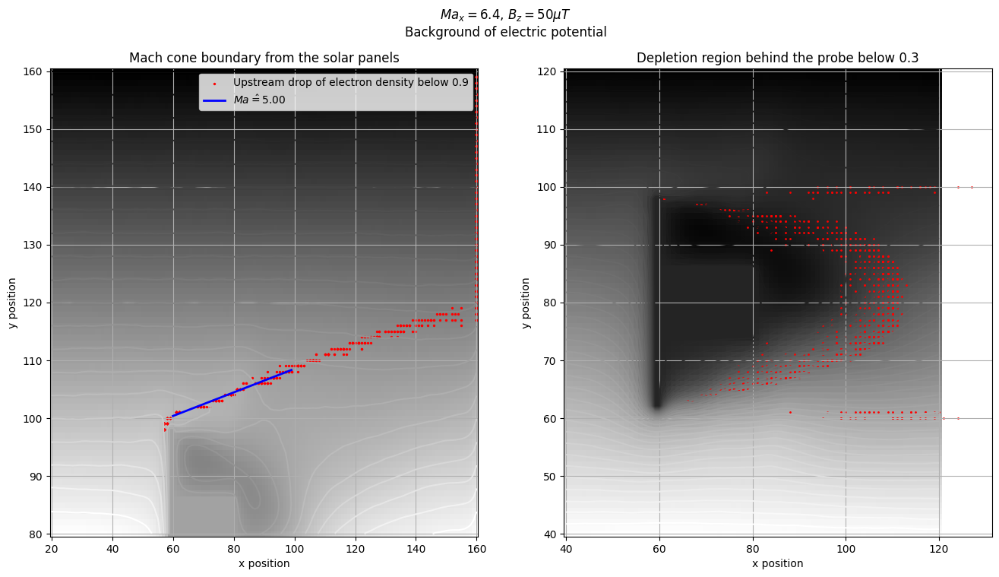

$Ma_x = 0.2$, $B_{x} = 0\mu T$ 0.15564927761801758 6.450715609558454
Based on the outer cone slope, Mach number is estimated to be 6.45


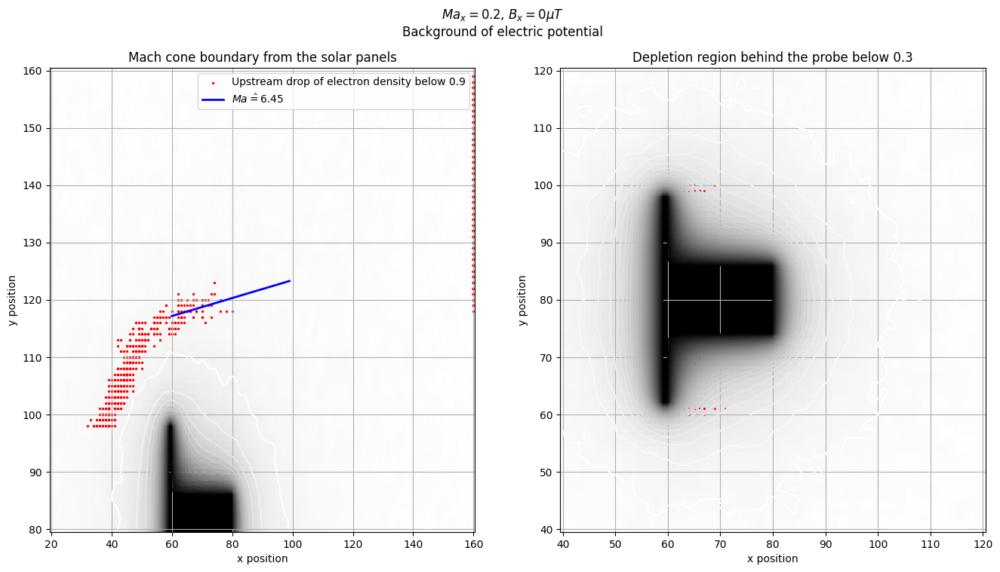

$Ma_x = 2.0$, $B_{x} = 70\mu T$ 0.4395402312791096 2.3500467839450296
Based on the outer cone slope, Mach number is estimated to be 2.35


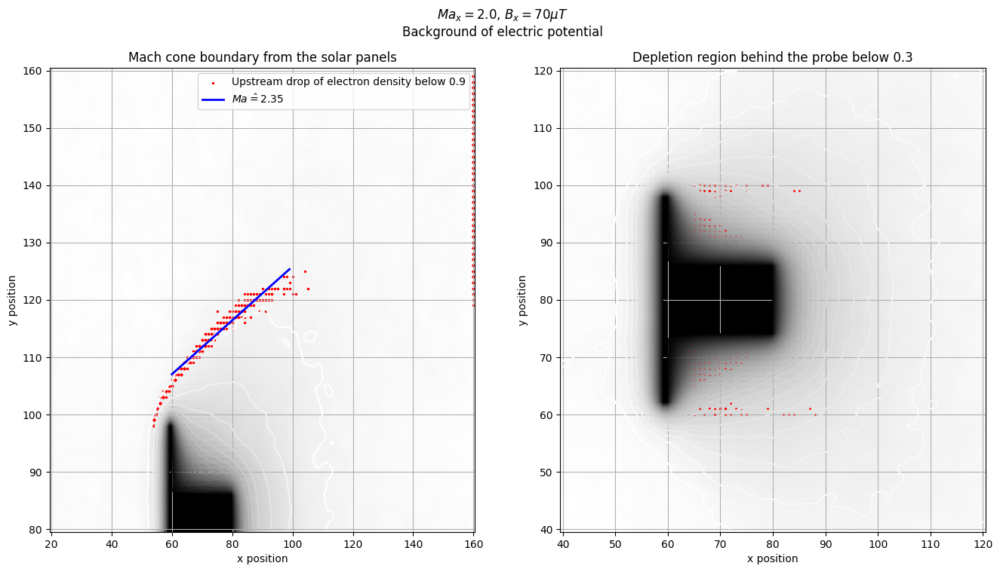

$Ma_x = 4.0$, $B_{x} = 50\mu T$ 0.3082674632023981 3.295889540082173
Based on the outer cone slope, Mach number is estimated to be 3.30


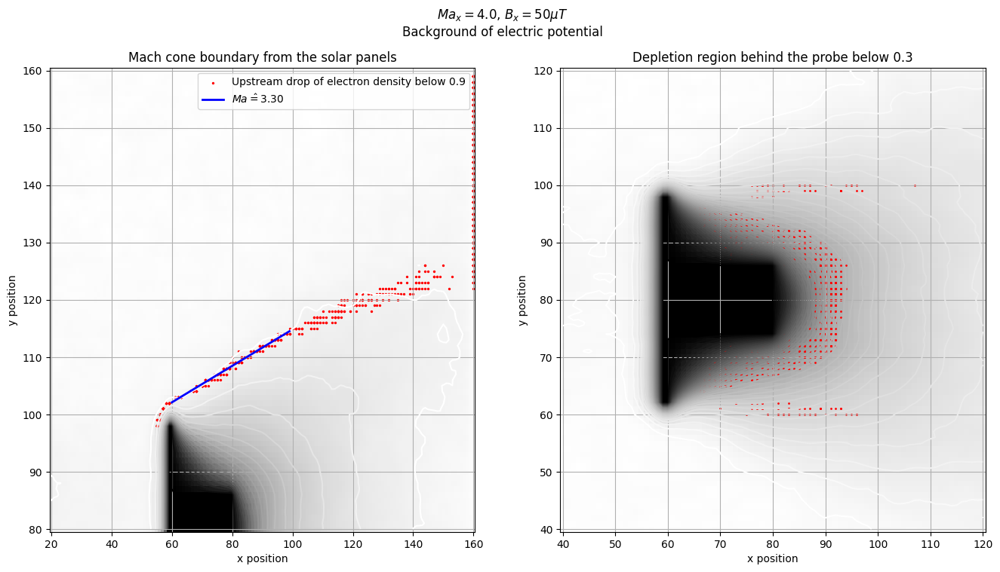

$Ma_x = 2.0$, $B_{x} = 100\mu T$ 0.4356685957271735 2.3695748303523603
Based on the outer cone slope, Mach number is estimated to be 2.37


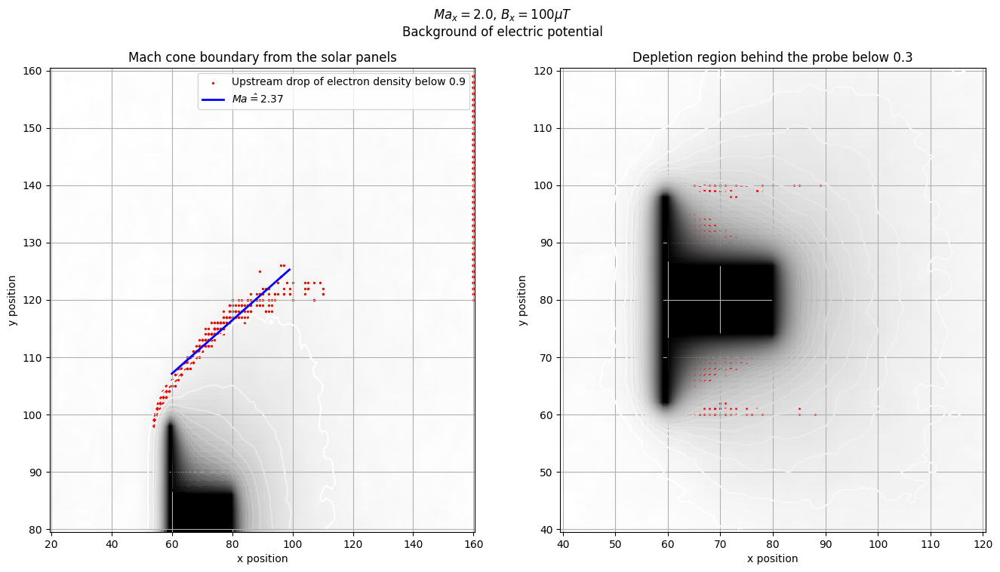

$Ma_x = 0.2$, $B_{z} = 50\mu T$ 0.15111120103273976 6.642895577243213
Based on the outer cone slope, Mach number is estimated to be 6.64


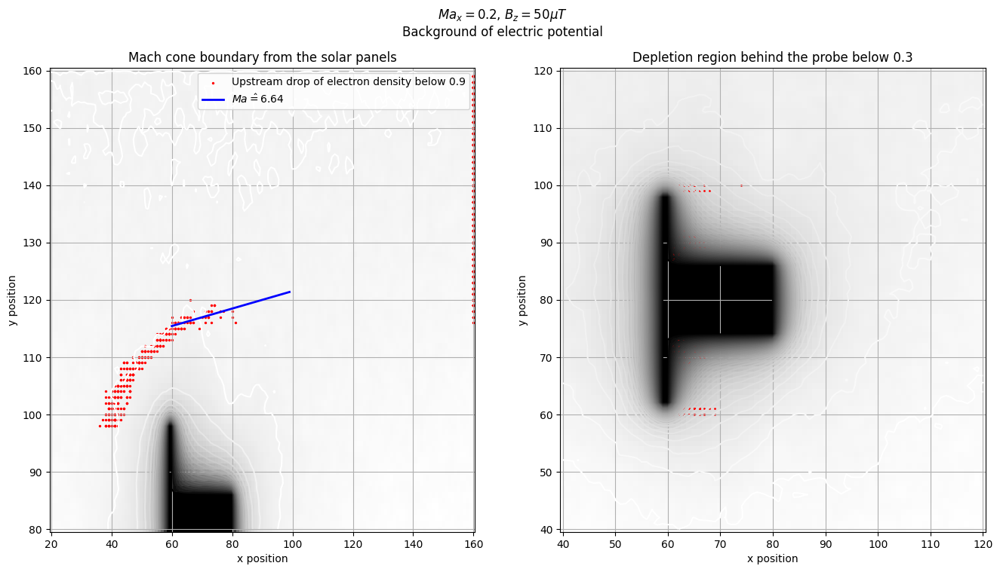

$Ma_x = 2.0$, $B_{x} = 50\mu T$ 0.42862996742653214 2.406014465055941
Based on the outer cone slope, Mach number is estimated to be 2.41


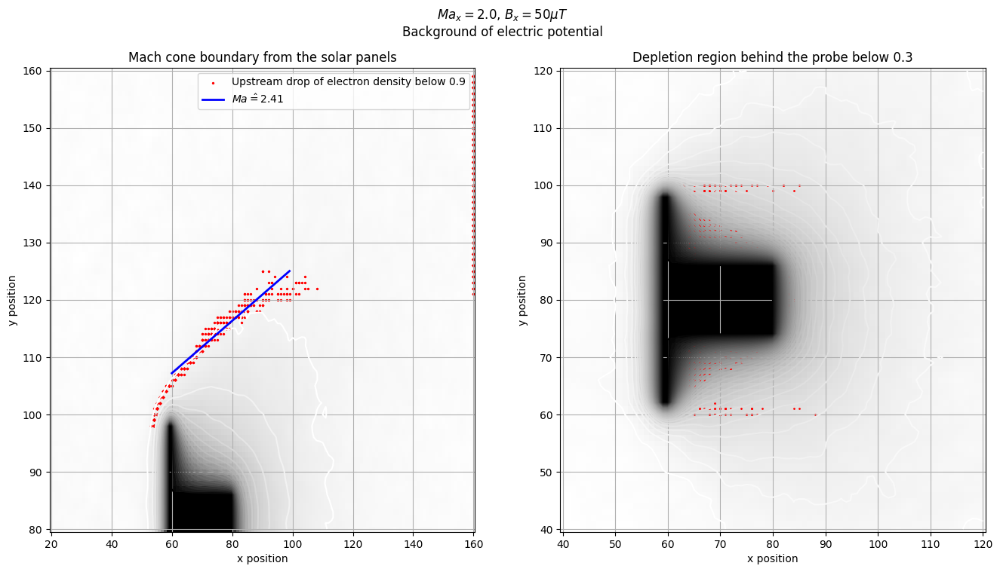

$Ma_x = 2.0$, $B_{x} = 0\mu T$ 0.3082674632023981 3.295889540082173
Based on the outer cone slope, Mach number is estimated to be 3.30


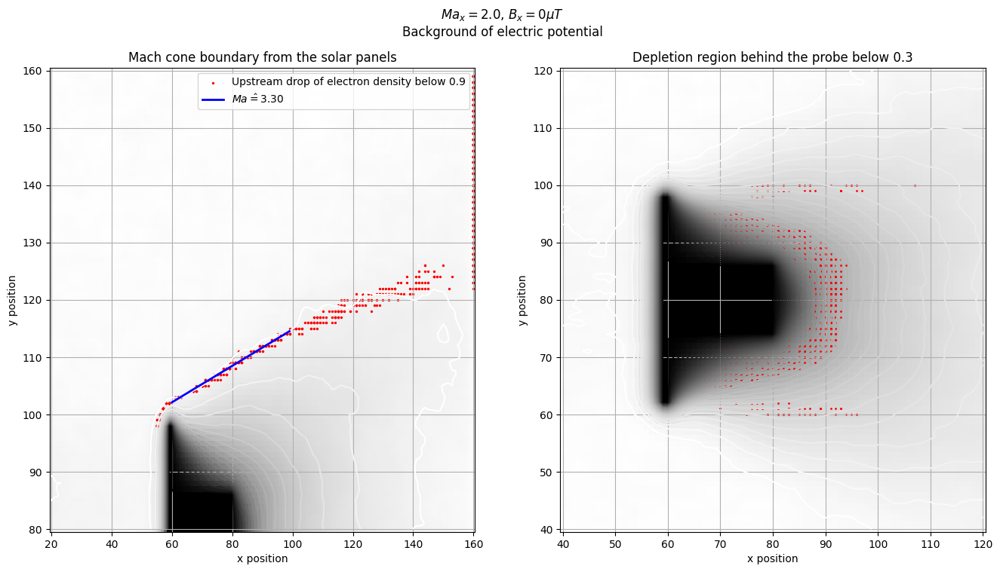

$Ma_x = 0.2$, $B_{x} = 50\mu T$ 0.17492423630442358 5.746019153388816
Based on the outer cone slope, Mach number is estimated to be 5.75


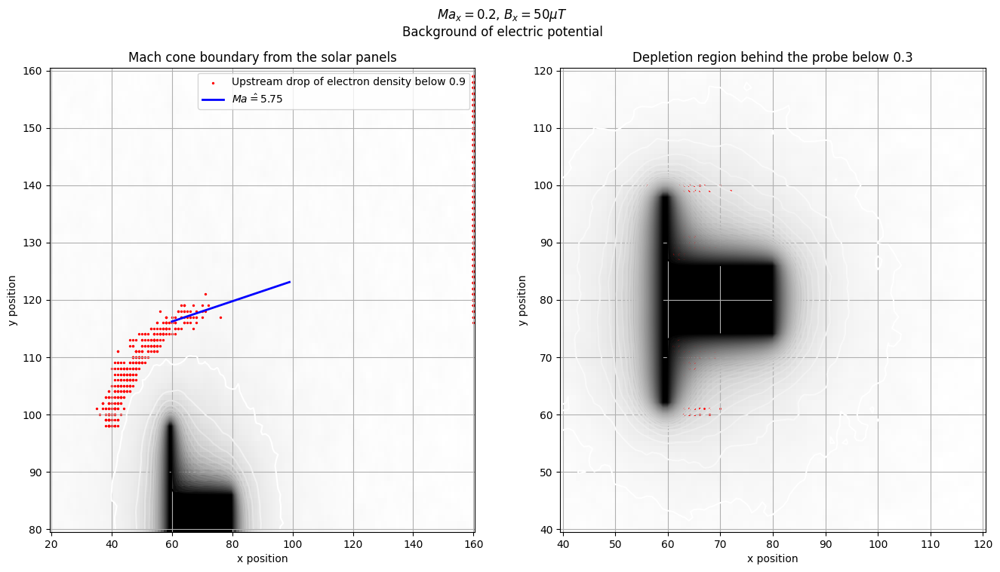

$Ma_x = 6.4$, $B_{x} = 50\mu T$ 0.18815047197040252 5.346383395151212
Based on the outer cone slope, Mach number is estimated to be 5.35


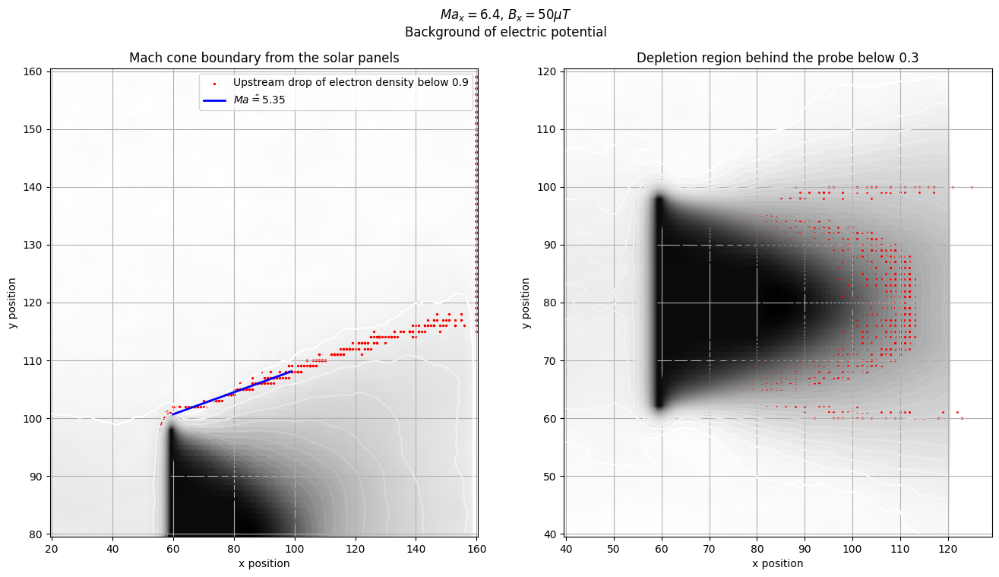

$Ma_x = 4.0$, $B_{x} = 0\mu T$ 0.3312703148110816 3.0746096628628647
Based on the outer cone slope, Mach number is estimated to be 3.07


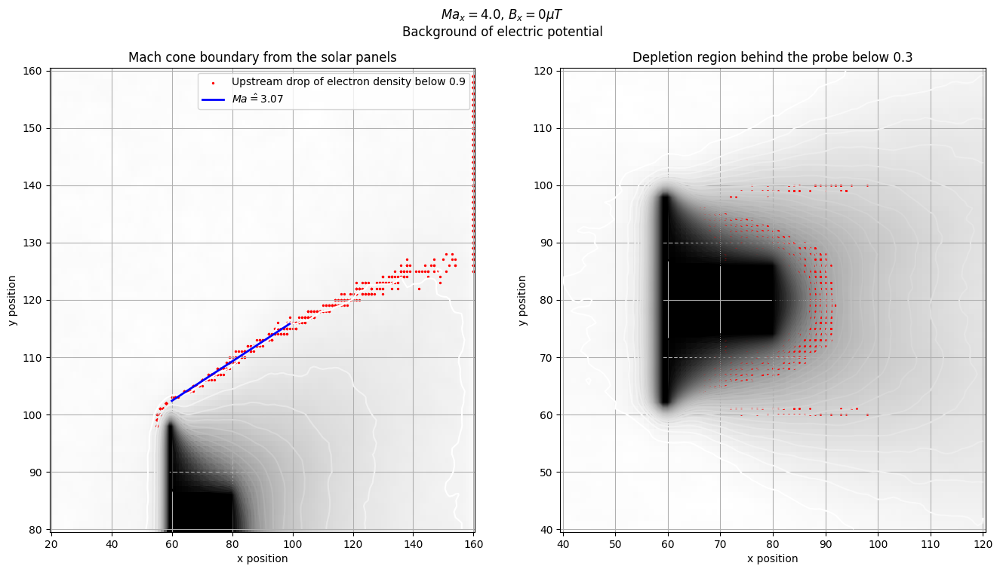

$Ma_x = 2.0$, $B_{z} = 50\mu T$ 0.3657691502053964 2.795891502153948
Based on the outer cone slope, Mach number is estimated to be 2.80


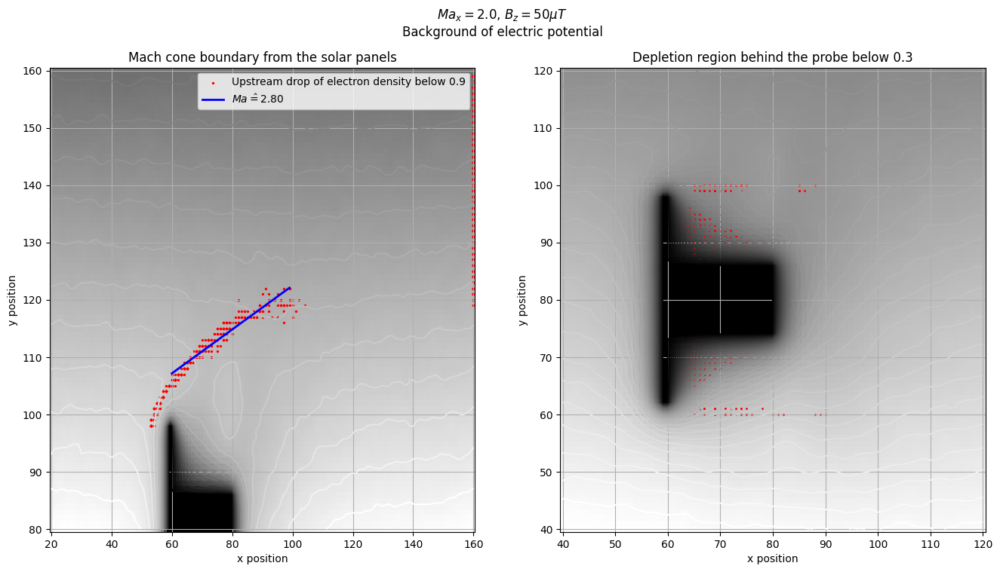

$Ma_x = 6.4$, $B_{x} = 0\mu T$ 0.2150199786642026 4.686761536097245
Based on the outer cone slope, Mach number is estimated to be 4.69


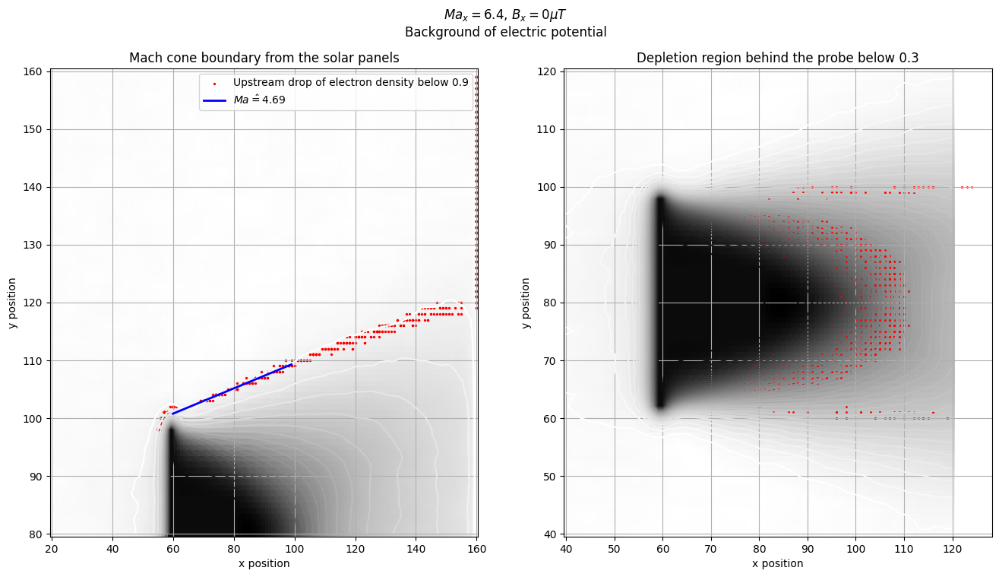

In [7]:
for name in dfs:
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    Bdir = re.search("^.*B(.)_.*", name).group(1)
    Ma = re.search("^.*_Ma(\d+\.?\d*)_.*$", name).group(1)
    Bmag = re.search("^.*_(\d+\.?\d*)uT.*", name).group(1)
    label = f"$Ma_x = {Ma}$, $B_{{{Bdir}}} = {Bmag}\\mu T$"

    plt.suptitle(label + "\nBackground of electric potential")
    outerCone(dfs[name], axs[0], "phisp", mode=1, N_average=4, np_boundary=0.9, background_steps=20)
    innerCone(dfs[name], axs[1], "phisp", background_steps=40)
    plt.show()

## Visualisation with electron density in the background

/tmp/ipykernel_339110/3020622026.py:44: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  m, c = np.linalg.lstsq(A, breaks[0])[0]
/tmp/ipykernel_339110/3020622026.py:46: RuntimeWarning: divide by zero encountered in scalar divide
  Ma = 1 / np.sin( angle )


$Ma_x = 6.4$, $B_{z} = 50\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


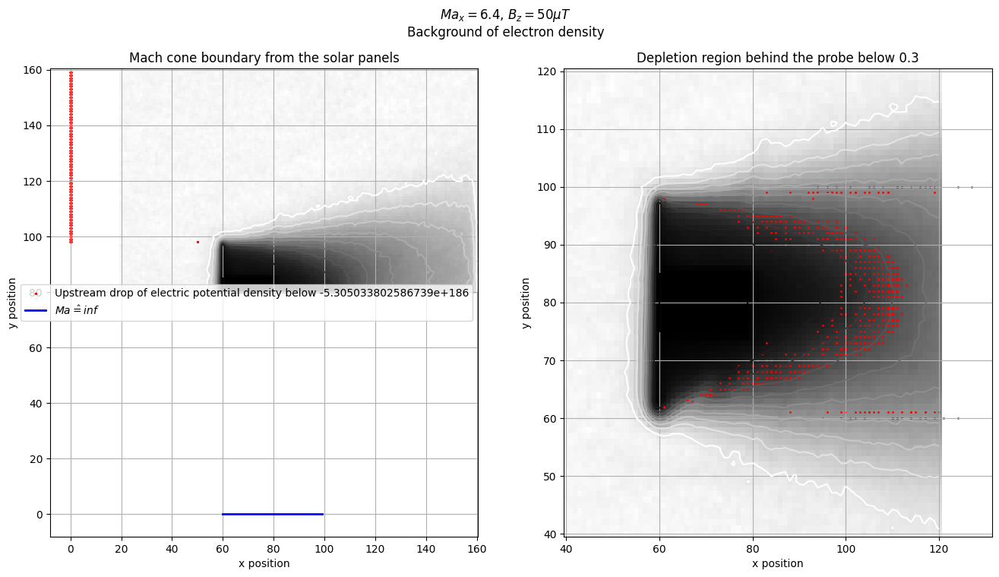

/tmp/ipykernel_339110/3020622026.py:28: RuntimeWarning: overflow encountered in scalar multiply
  np_boundary = (ys.max() - ys.min()) * np_boundary + ys.min()


$Ma_x = 0.2$, $B_{x} = 0\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


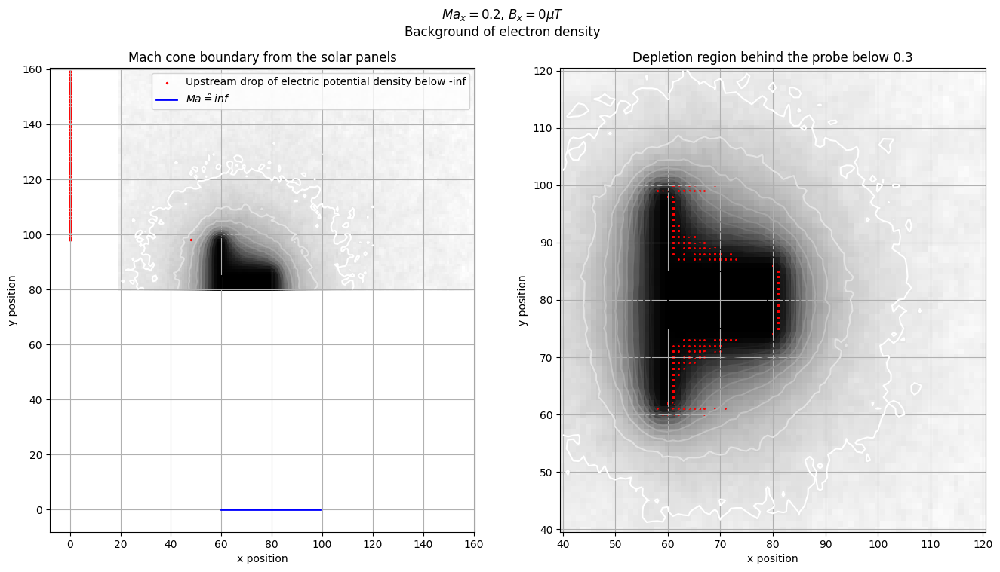

$Ma_x = 2.0$, $B_{x} = 70\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


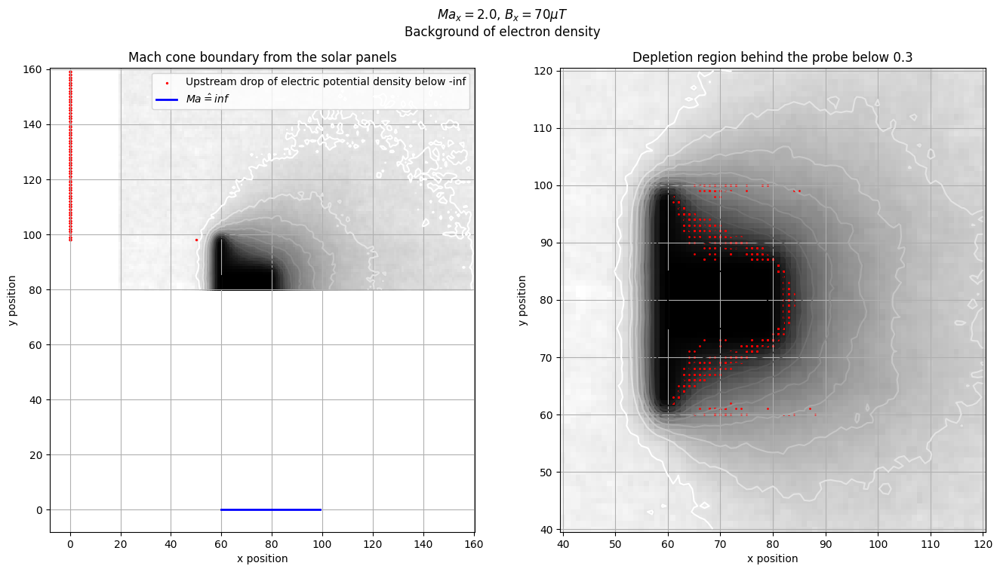

$Ma_x = 4.0$, $B_{x} = 50\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


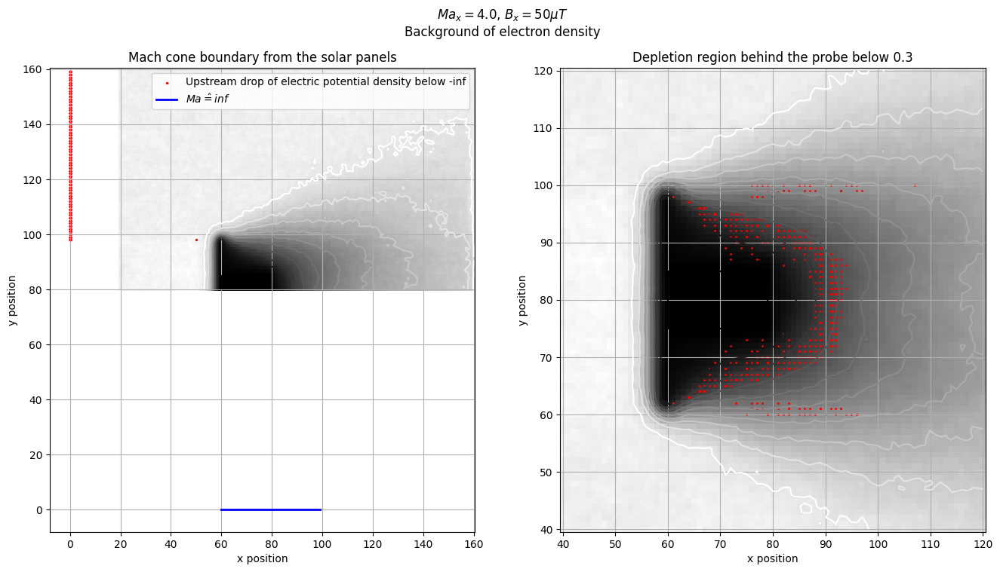

$Ma_x = 2.0$, $B_{x} = 100\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


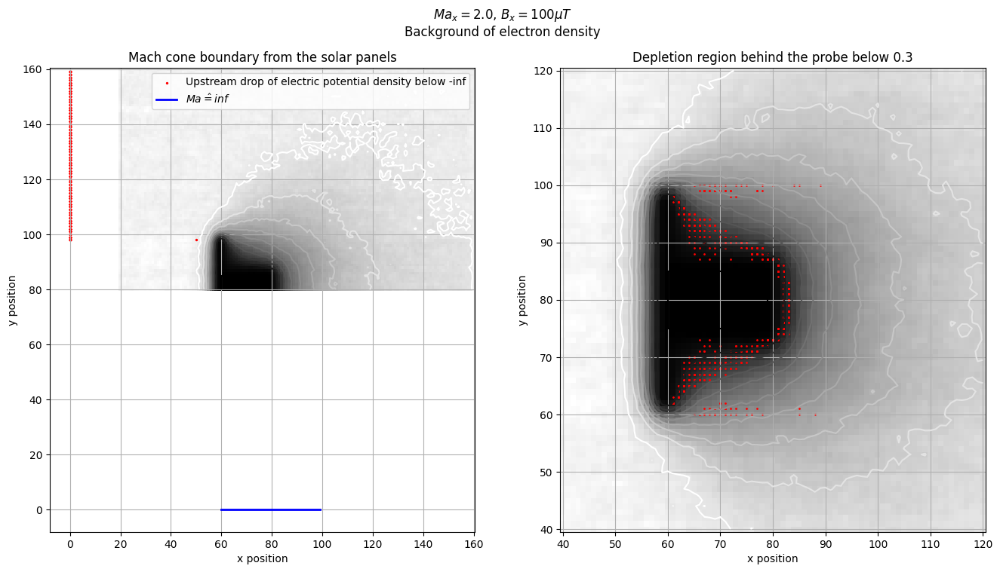

$Ma_x = 0.2$, $B_{z} = 50\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


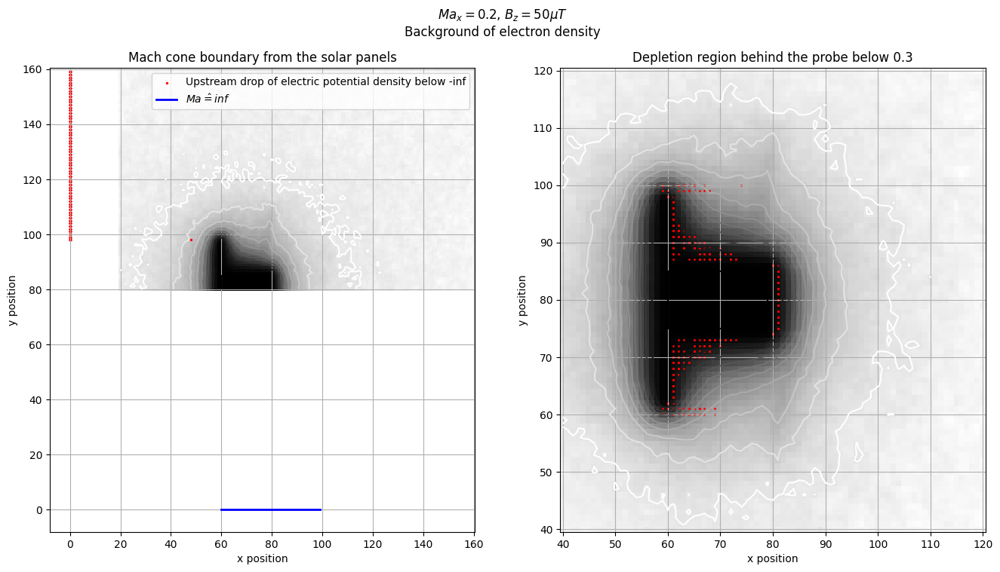

$Ma_x = 2.0$, $B_{x} = 50\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


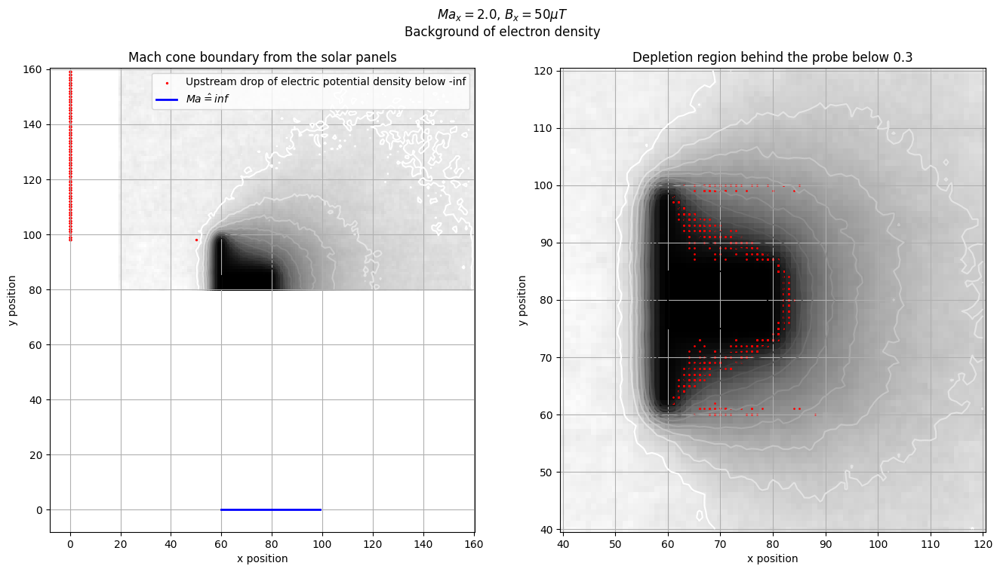

$Ma_x = 2.0$, $B_{x} = 0\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


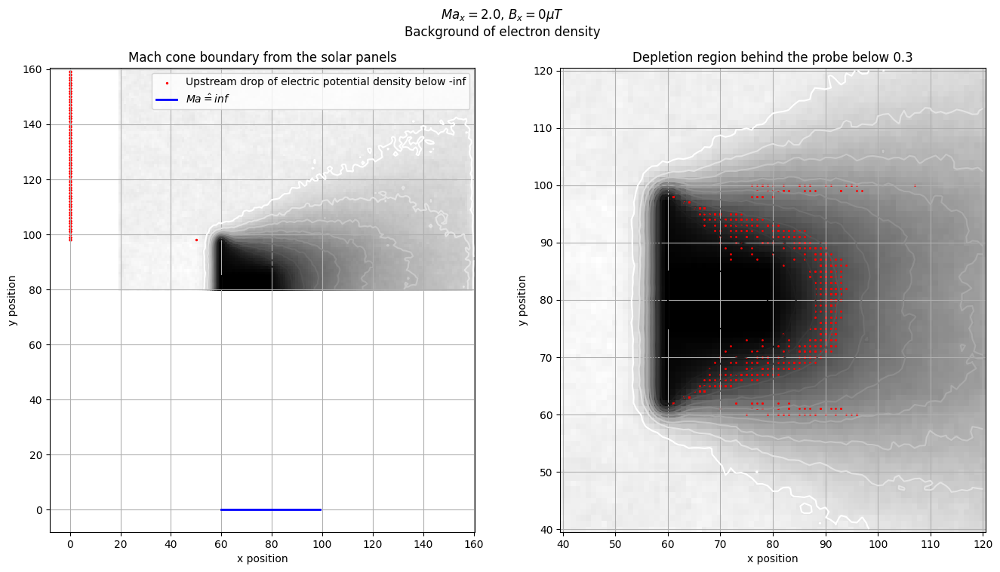

$Ma_x = 0.2$, $B_{x} = 50\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


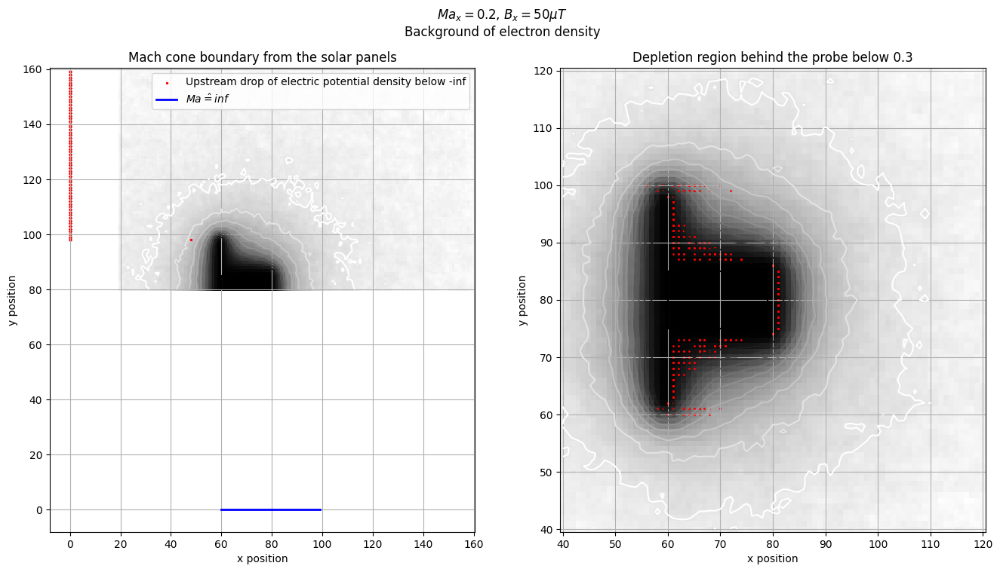

$Ma_x = 6.4$, $B_{x} = 50\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


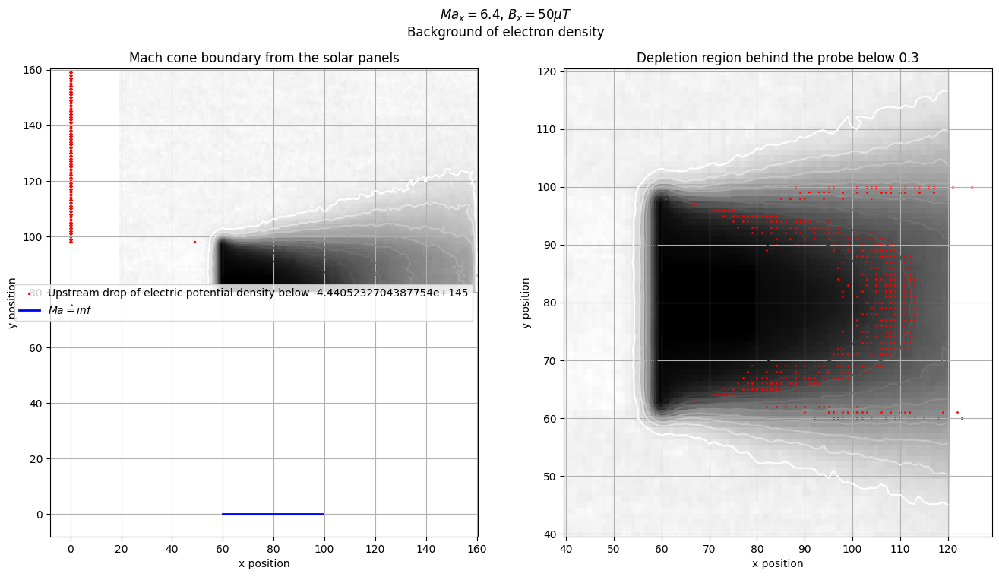

$Ma_x = 4.0$, $B_{x} = 0\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


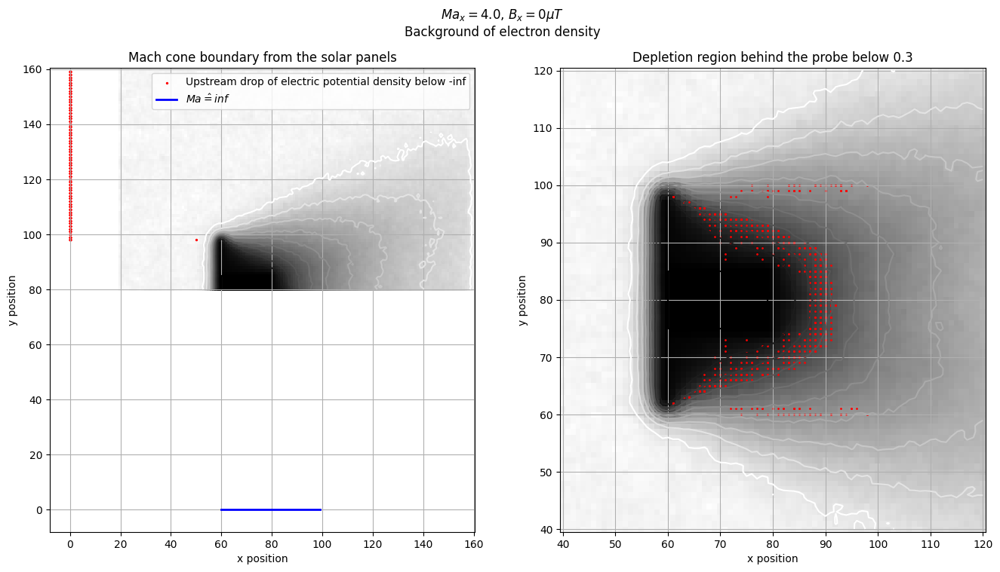

$Ma_x = 2.0$, $B_{z} = 50\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


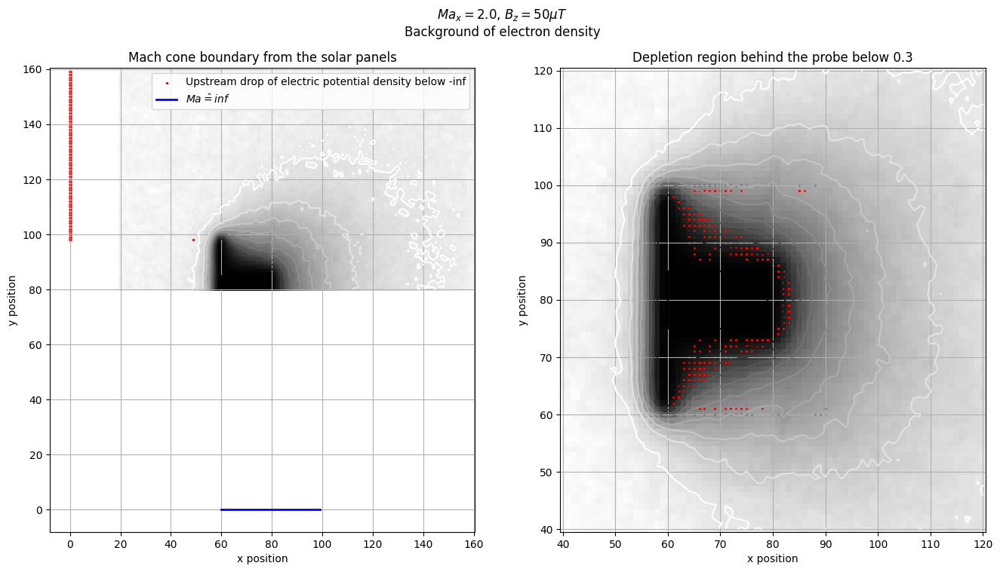

$Ma_x = 6.4$, $B_{x} = 0\mu T$ 0.0 inf
Based on the outer cone slope, Mach number is estimated to be inf


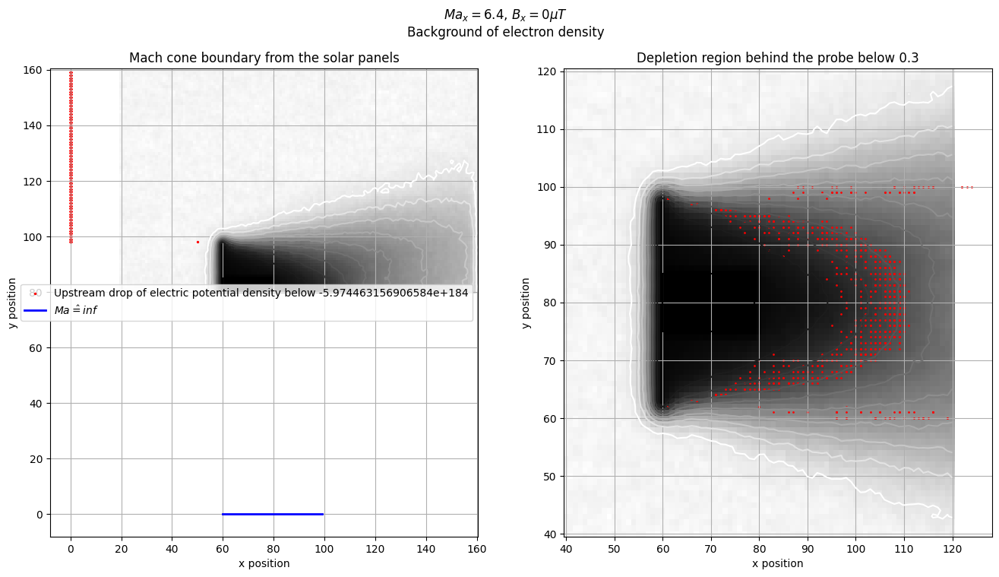

In [8]:
for name in dfs:
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    Bdir = re.search("^.*B(.)_.*", name).group(1)
    Ma = re.search("^.*_Ma(\d+\.?\d*)_.*$", name).group(1)
    Bmag = re.search("^.*_(\d+\.?\d*)uT.*", name).group(1)
    label = f"$Ma_x = {Ma}$, $B_{{{Bdir}}} = {Bmag}\\mu T$"

    plt.suptitle(label + "\nBackground of electron density")
    outerCone(dfs[name], axs[0], "nd1p")
    innerCone(dfs[name], axs[1], "nd1p")
    plt.show()

## Visualisation with ion density in the background

/tmp/ipykernel_339110/3020622026.py:44: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  m, c = np.linalg.lstsq(A, breaks[0])[0]


$Ma_x = 6.4$, $B_{z} = 50\mu T$ 0.20394178322521042 4.93751604645285
Based on the outer cone slope, Mach number is estimated to be 4.94


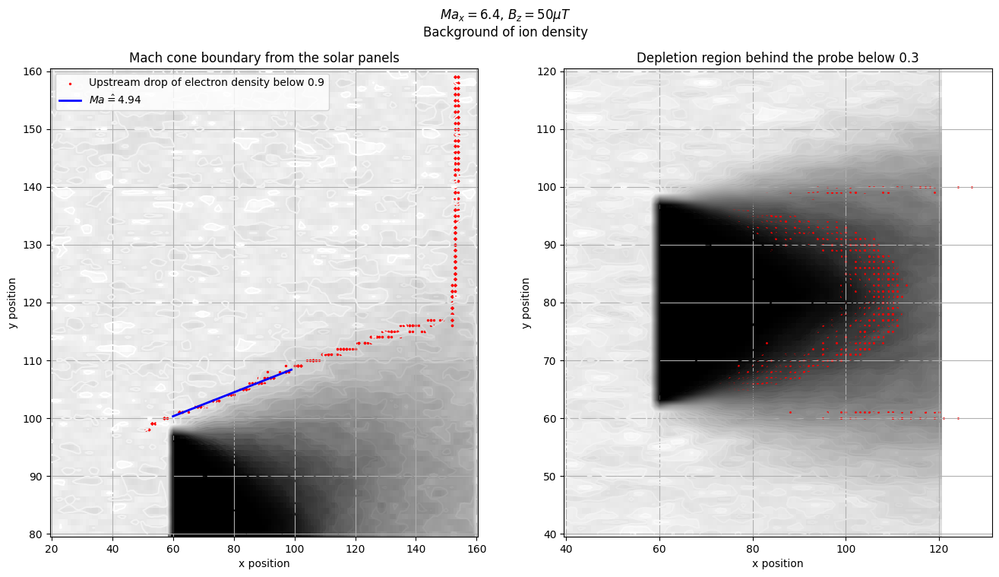

$Ma_x = 0.2$, $B_{x} = 0\mu T$ 0.07325298762247621 13.663536820146128
Based on the outer cone slope, Mach number is estimated to be 13.66


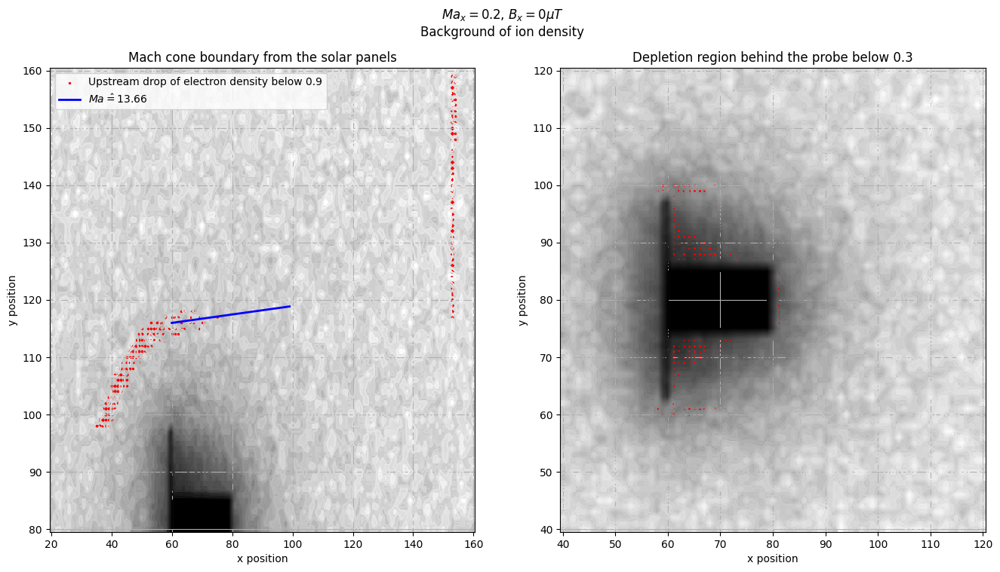

$Ma_x = 2.0$, $B_{x} = 70\mu T$ 0.42162825072952526 2.4435142009260646
Based on the outer cone slope, Mach number is estimated to be 2.44


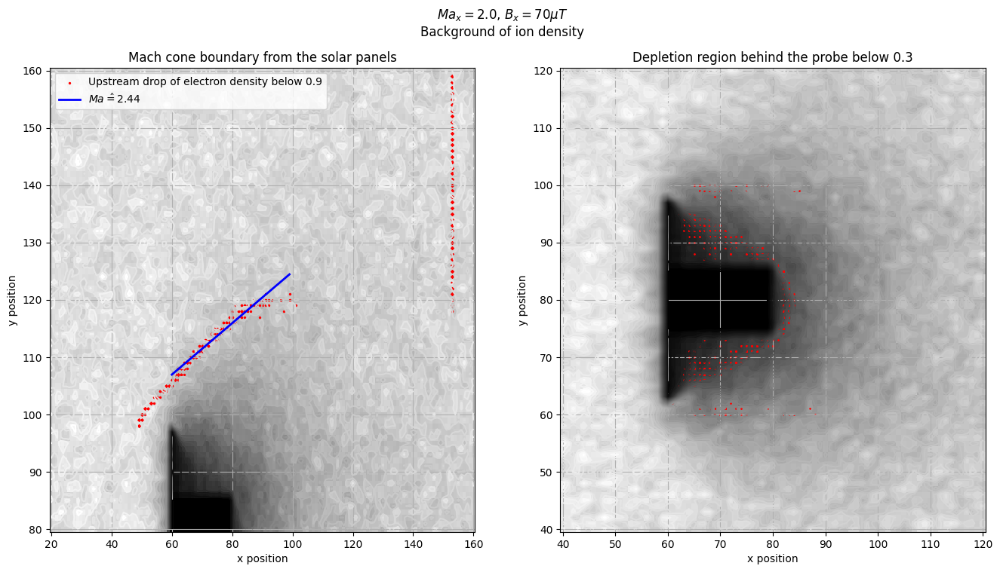

$Ma_x = 4.0$, $B_{x} = 50\mu T$ 0.30316353555228875 3.3496240760286002
Based on the outer cone slope, Mach number is estimated to be 3.35


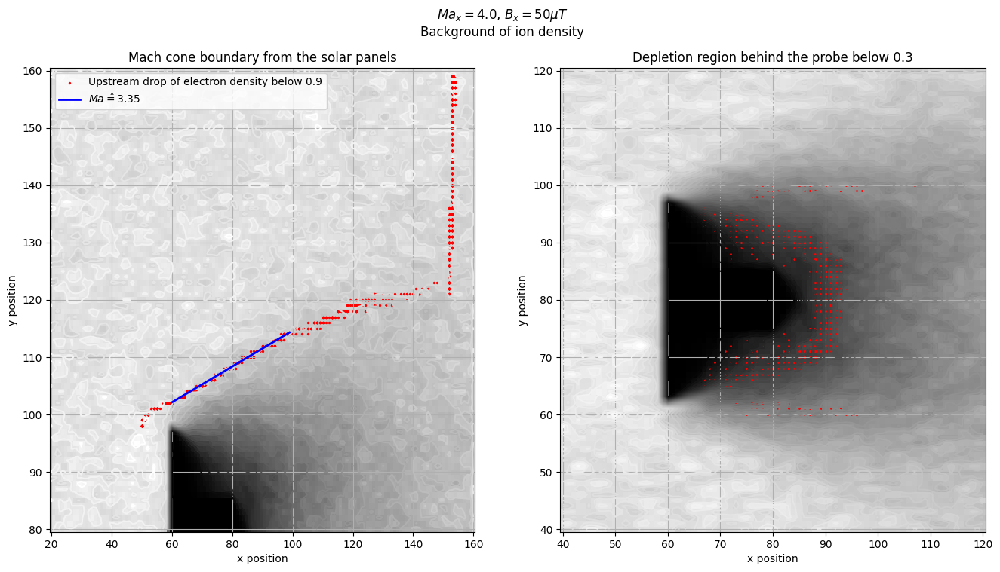

$Ma_x = 2.0$, $B_{x} = 100\mu T$ 0.4146222292380353 2.482349271427294
Based on the outer cone slope, Mach number is estimated to be 2.48


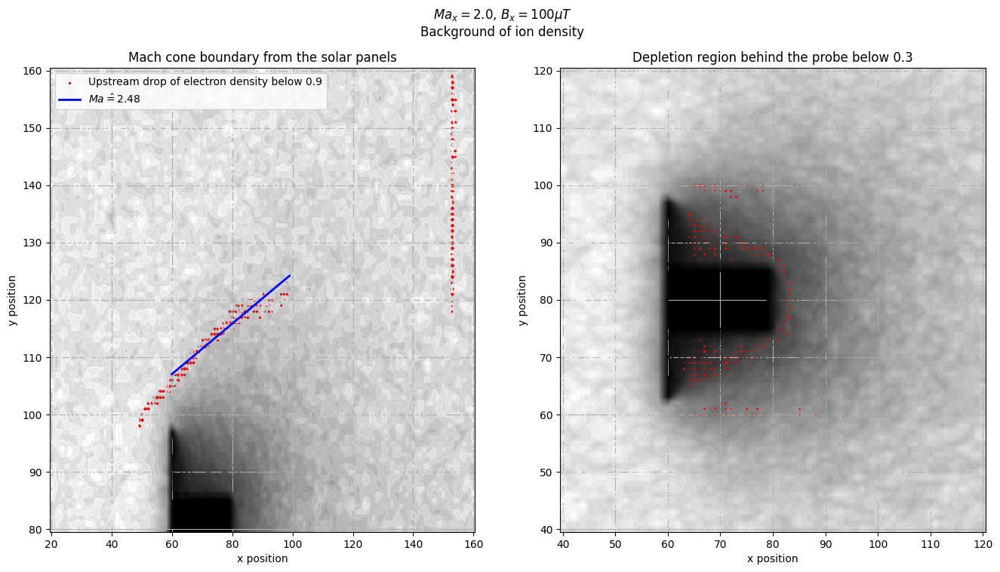

$Ma_x = 0.2$, $B_{z} = 50\mu T$ 0.20997351286216417 4.797681886003883
Based on the outer cone slope, Mach number is estimated to be 4.80


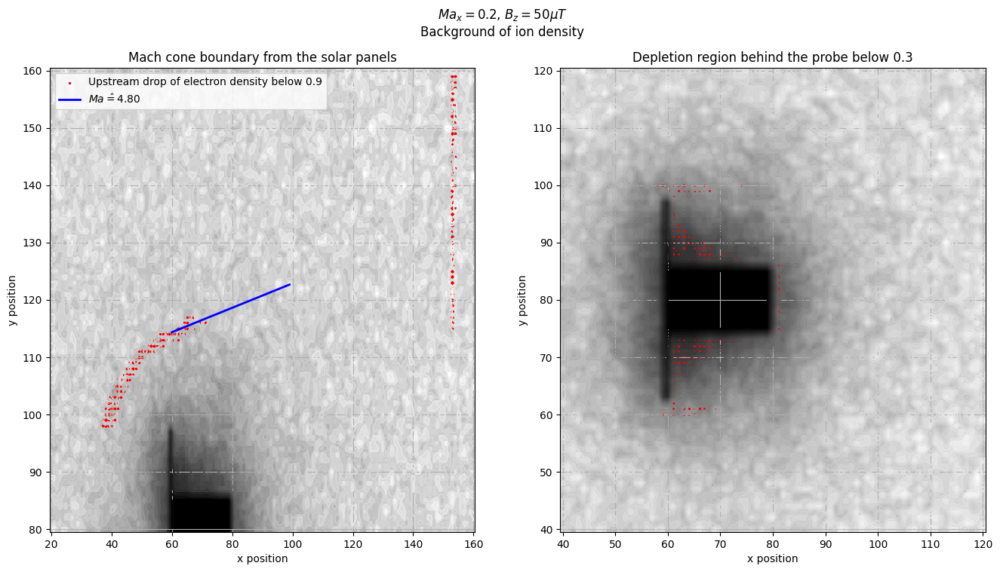

$Ma_x = 2.0$, $B_{x} = 50\mu T$ 0.4134646026042778 2.4888971017501746
Based on the outer cone slope, Mach number is estimated to be 2.49


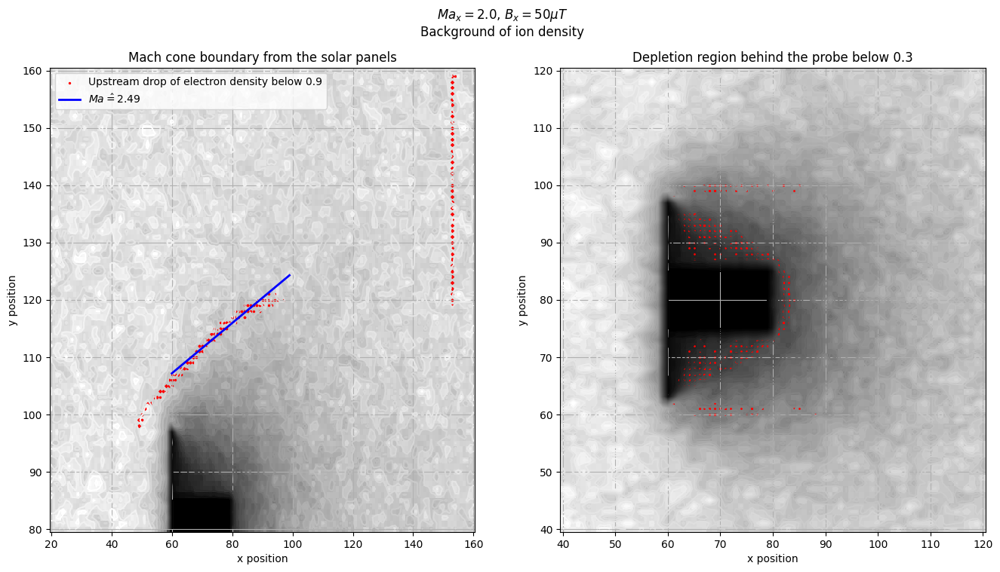

$Ma_x = 2.0$, $B_{x} = 0\mu T$ 0.30316353555228875 3.3496240760286002
Based on the outer cone slope, Mach number is estimated to be 3.35


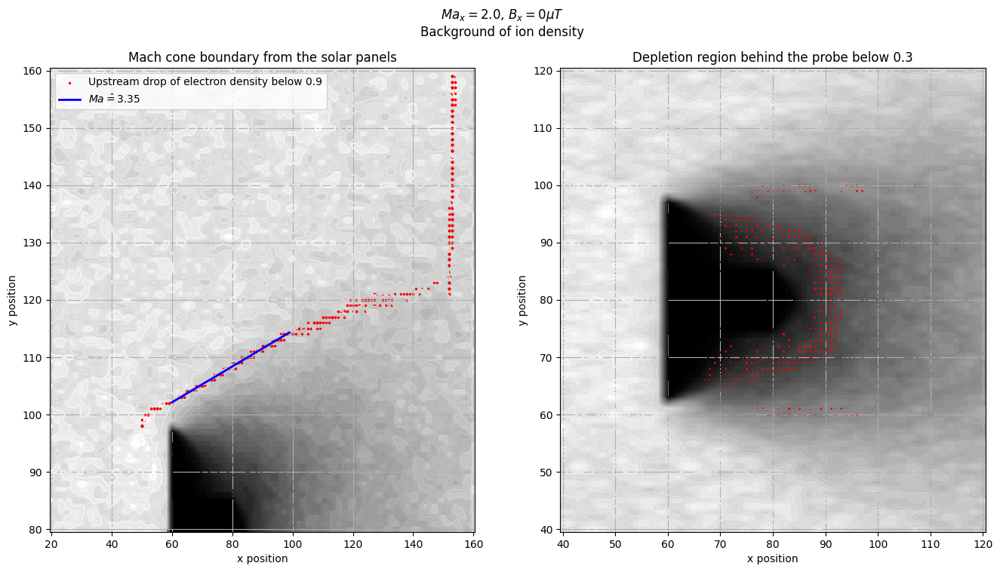

$Ma_x = 0.2$, $B_{x} = 50\mu T$ 0.023824579203074465 41.97743009447695
Based on the outer cone slope, Mach number is estimated to be 41.98


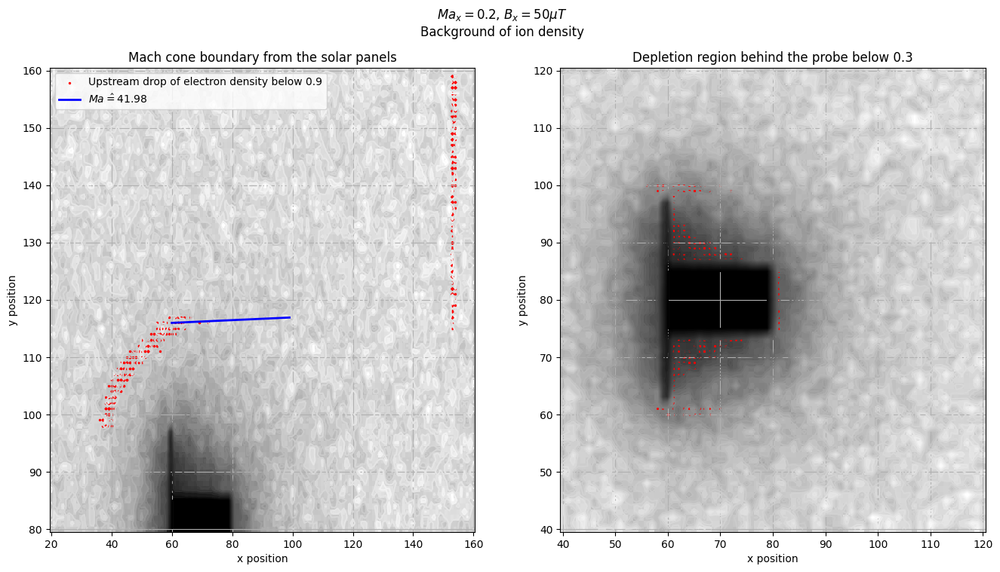

$Ma_x = 6.4$, $B_{x} = 50\mu T$ 0.18159625722091663 5.537104316036185
Based on the outer cone slope, Mach number is estimated to be 5.54


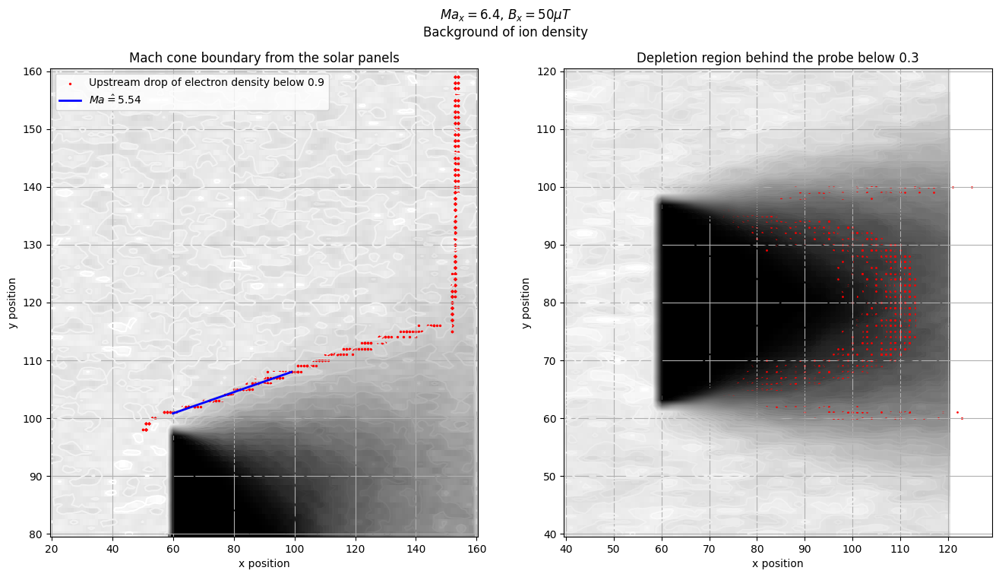

$Ma_x = 4.0$, $B_{x} = 0\mu T$ 0.3278549672037966 3.1054647574764407
Based on the outer cone slope, Mach number is estimated to be 3.11


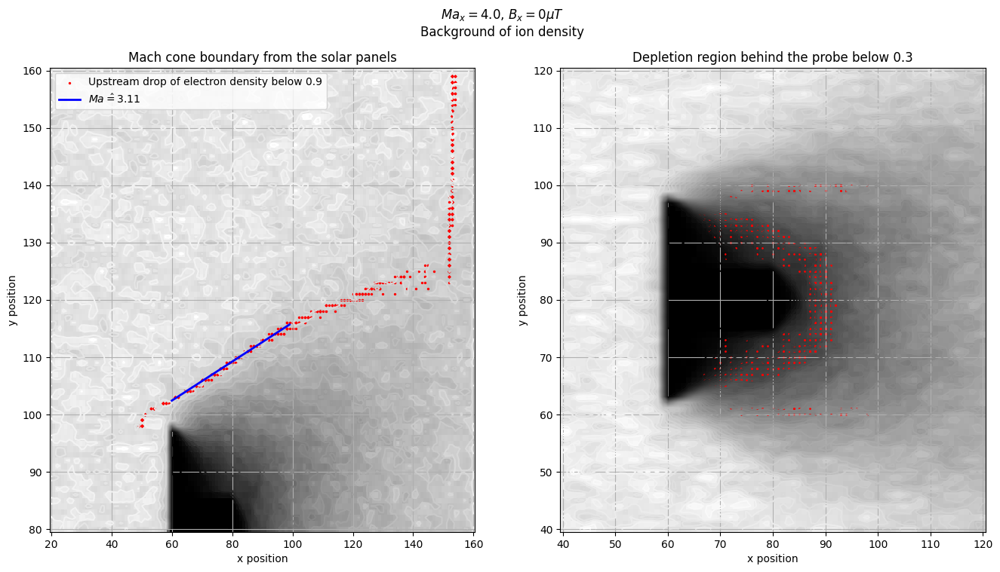

$Ma_x = 2.0$, $B_{z} = 50\mu T$ 0.35519114169986643 2.8754671227746242
Based on the outer cone slope, Mach number is estimated to be 2.88


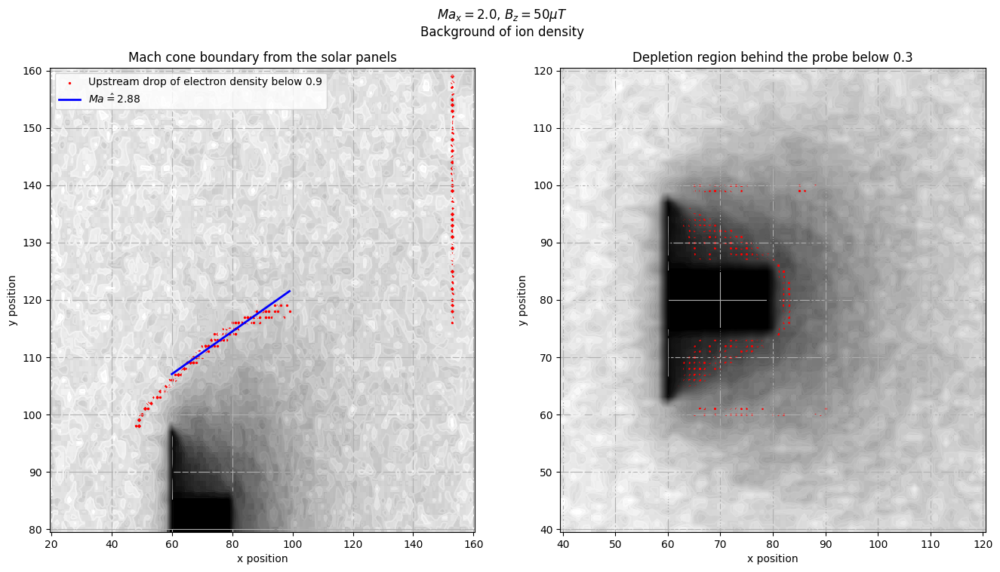

$Ma_x = 6.4$, $B_{x} = 0\mu T$ 0.20178686414046984 4.989515567799106
Based on the outer cone slope, Mach number is estimated to be 4.99


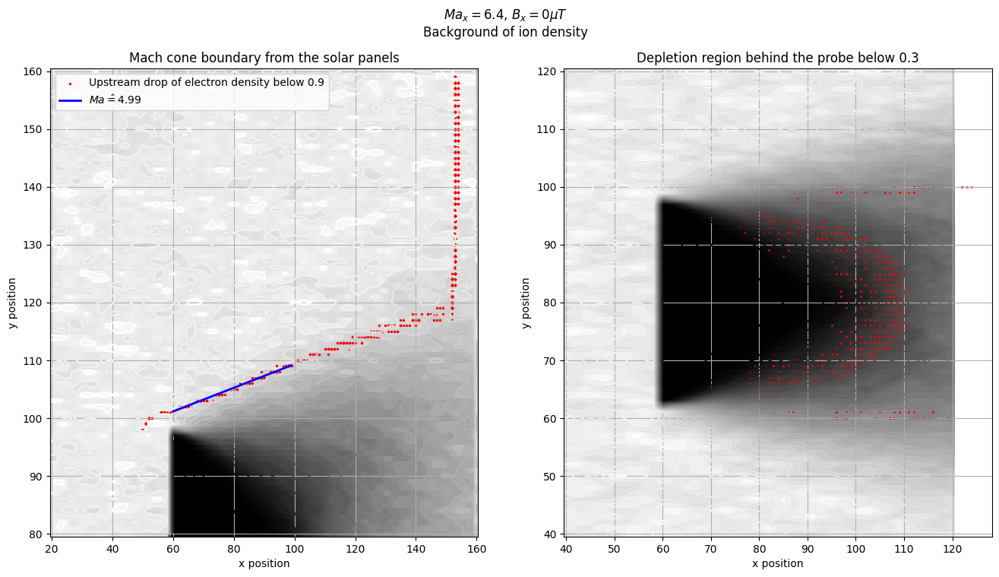

In [9]:
for name in dfs:
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    Bdir = re.search("^.*B(.)_.*", name).group(1)
    Ma = re.search("^.*_Ma(\d+\.?\d*)_.*$", name).group(1)
    Bmag = re.search("^.*_(\d+\.?\d*)uT.*", name).group(1)
    label = f"$Ma_x = {Ma}$, $B_{{{Bdir}}} = {Bmag}\\mu T$"

    plt.suptitle(label + "\nBackground of ion density")
    outerCone(dfs[name], axs[0], "nd2p", mode=1, N_average=20, np_boundary=0.9, background_steps=20)
    innerCone(dfs[name], axs[1], "nd2p", background_steps=40)
    plt.show()

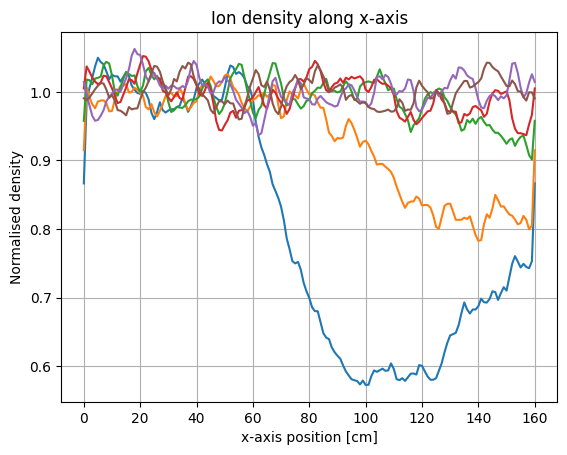

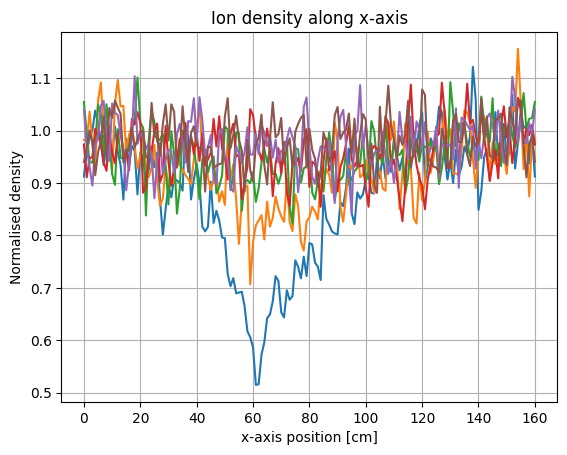

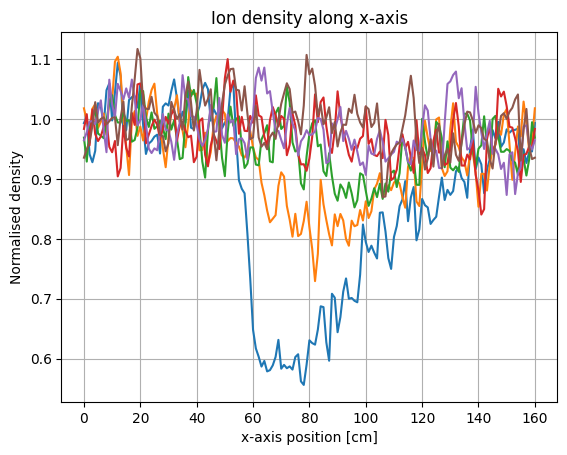

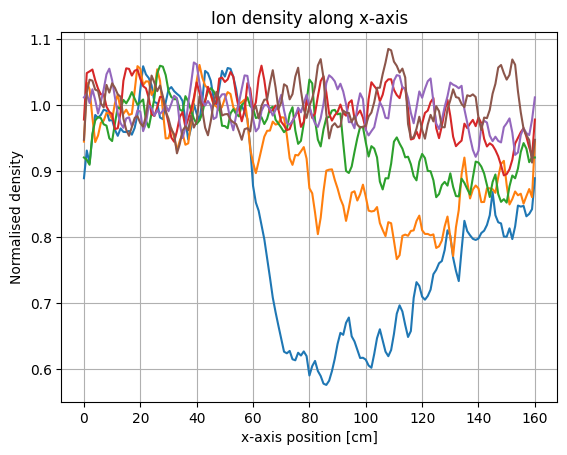

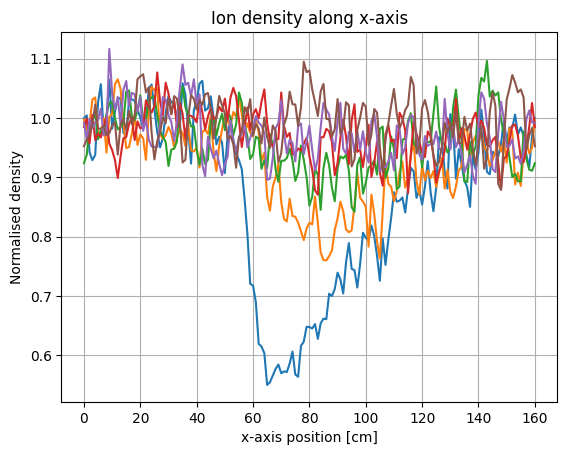

...

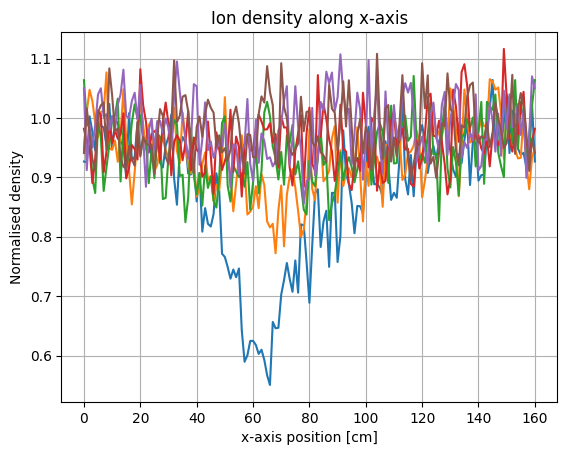

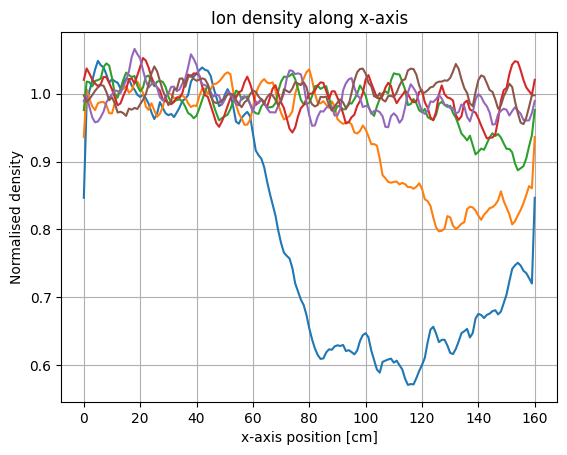

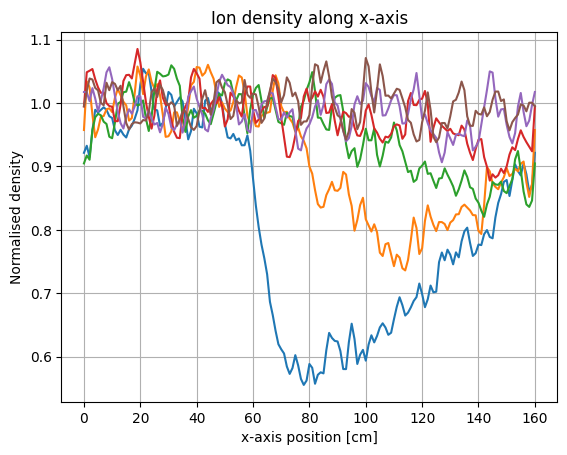

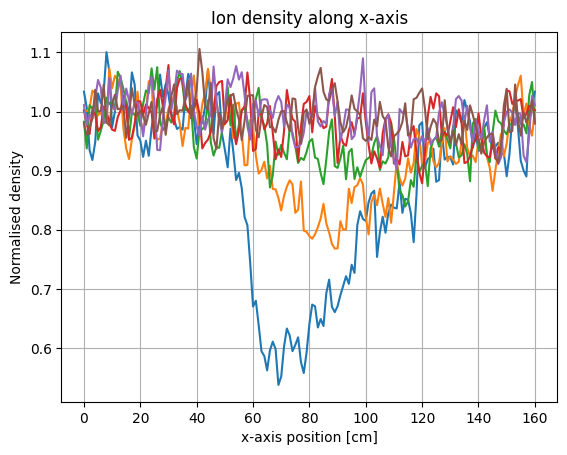

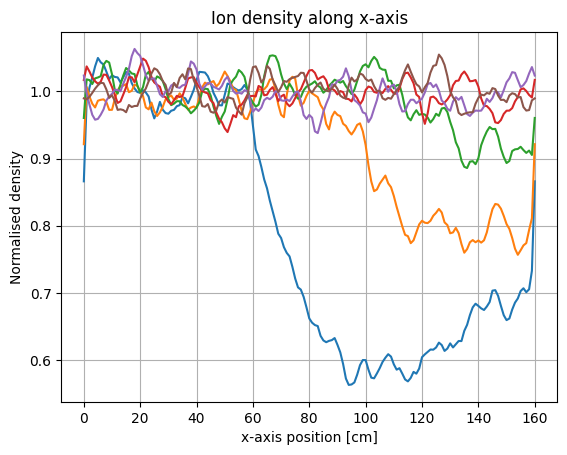

In [10]:
for file in dfs:
    df = dfs[file]
    N_average = 1
    breaks = []
    for y in range(100, 160, 10):
        mask = (df["Structured Coordinates:1"]==y)&(df["Structured Coordinates:2"]==80)
        masked = df[mask]
        xs = masked["Structured Coordinates:0"]
        ys = masked["nd2p"]
        ys = np.convolve(ys, np.ones(N_average), mode='same') / N_average
        below = (xs>N_average/2)&(ys<0.97)
        breaks.append([y, np.argmax(below)])
        plt.plot(xs, ys, label=f"y={y}")
    breaks = np.array(breaks).T
    plt.grid()
    plt.title("Ion density along x-axis")
    plt.xlabel("x-axis position [cm]")
    plt.ylabel("Normalised density")
    # plt.legend()
    plt.show()

## Mach number estimated based on the electron density

/tmp/ipykernel_339110/3020622026.py:44: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  m, c = np.linalg.lstsq(A, breaks[0])[0]


$Ma_x = 6.4$, $B_{z} = 50\mu T$ 0.20116885241817567 5.004635593486884
Based on the outer cone slope, Mach number is estimated to be 5.00


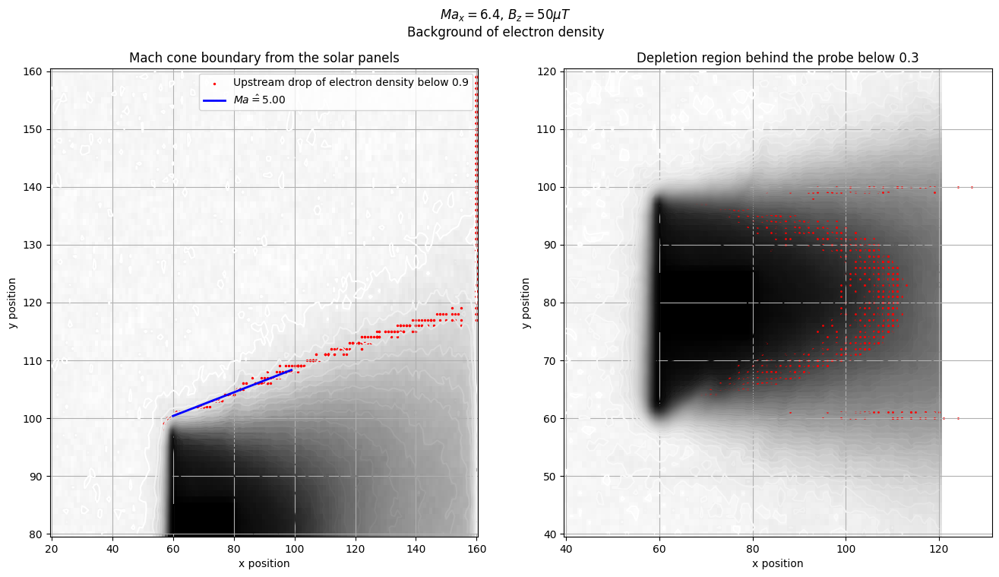

$Ma_x = 0.2$, $B_{x} = 0\mu T$ 0.15564927761801758 6.450715609558454
Based on the outer cone slope, Mach number is estimated to be 6.45


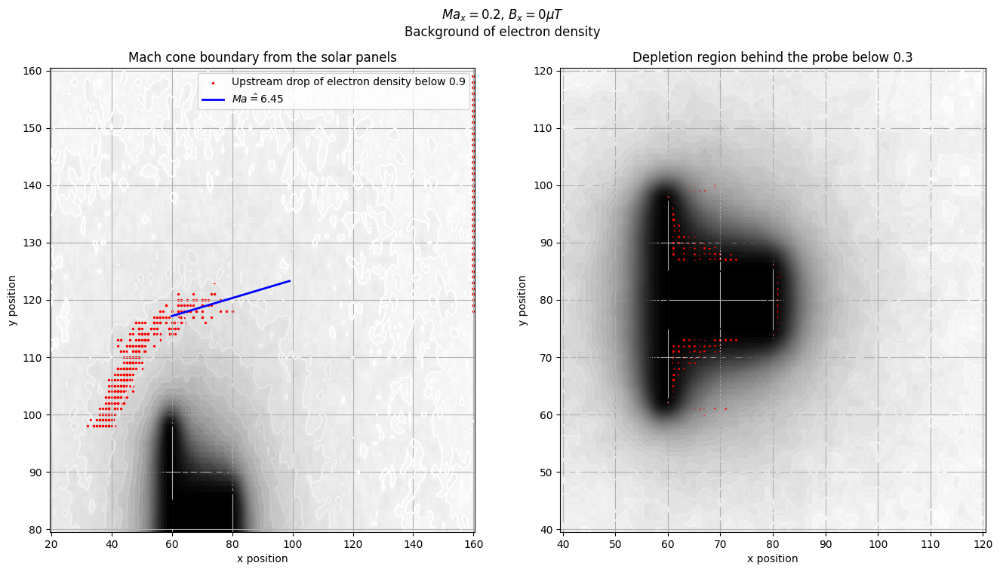

$Ma_x = 2.0$, $B_{x} = 70\mu T$ 0.4395402312791096 2.3500467839450296
Based on the outer cone slope, Mach number is estimated to be 2.35


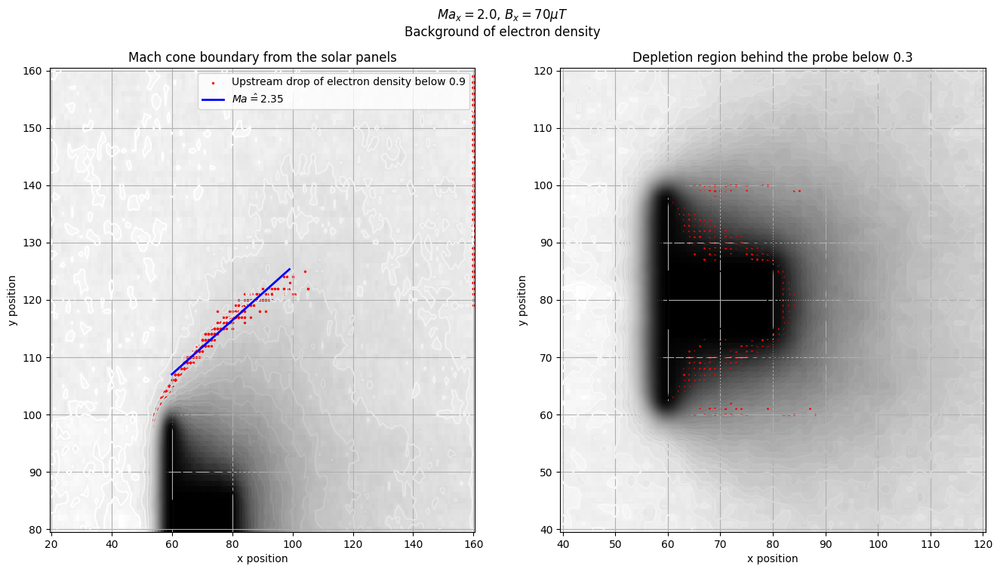

$Ma_x = 4.0$, $B_{x} = 50\mu T$ 0.3082674632023981 3.295889540082173
Based on the outer cone slope, Mach number is estimated to be 3.30


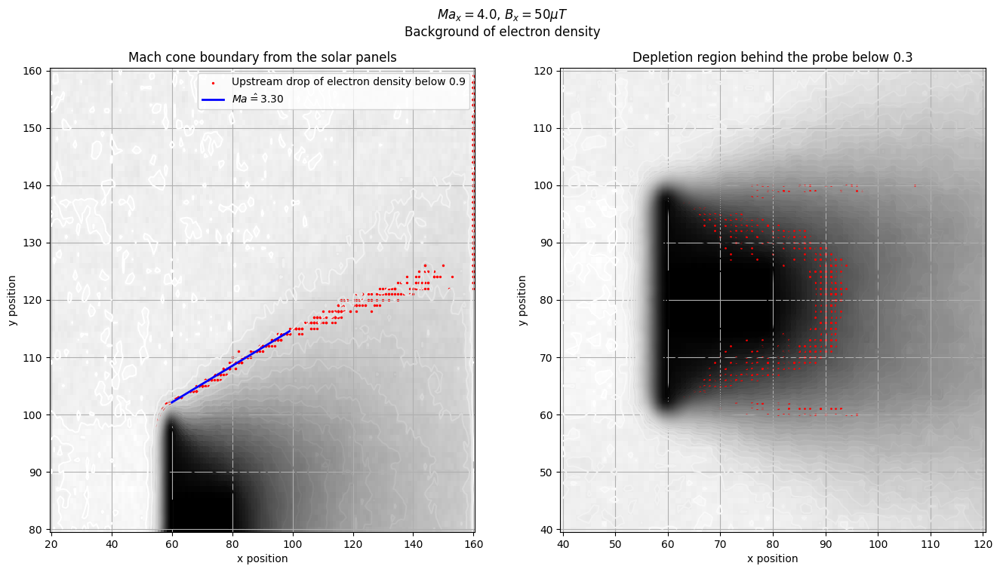

$Ma_x = 2.0$, $B_{x} = 100\mu T$ 0.4356685957271735 2.3695748303523603
Based on the outer cone slope, Mach number is estimated to be 2.37


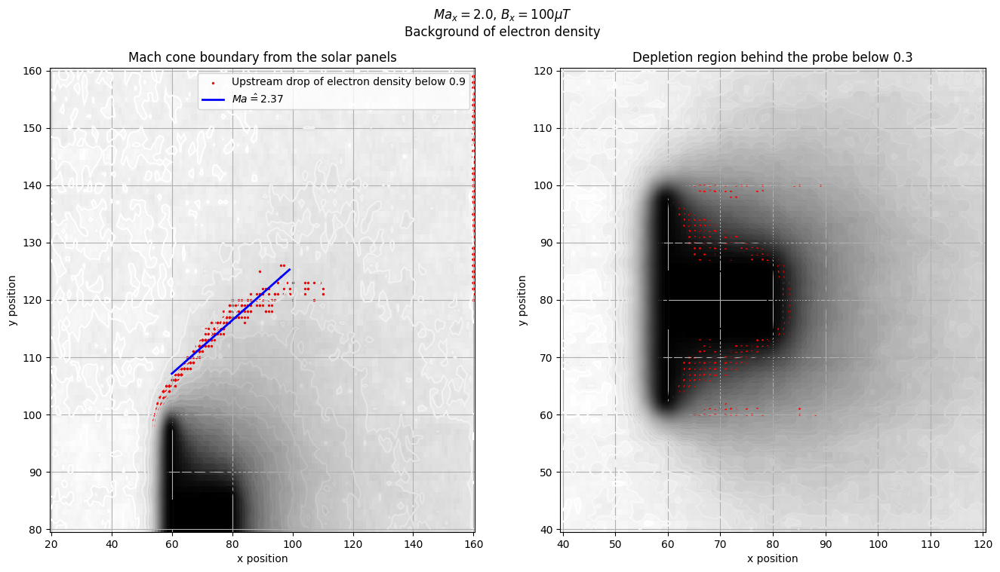

$Ma_x = 0.2$, $B_{z} = 50\mu T$ 0.15111120103273976 6.642895577243213
Based on the outer cone slope, Mach number is estimated to be 6.64


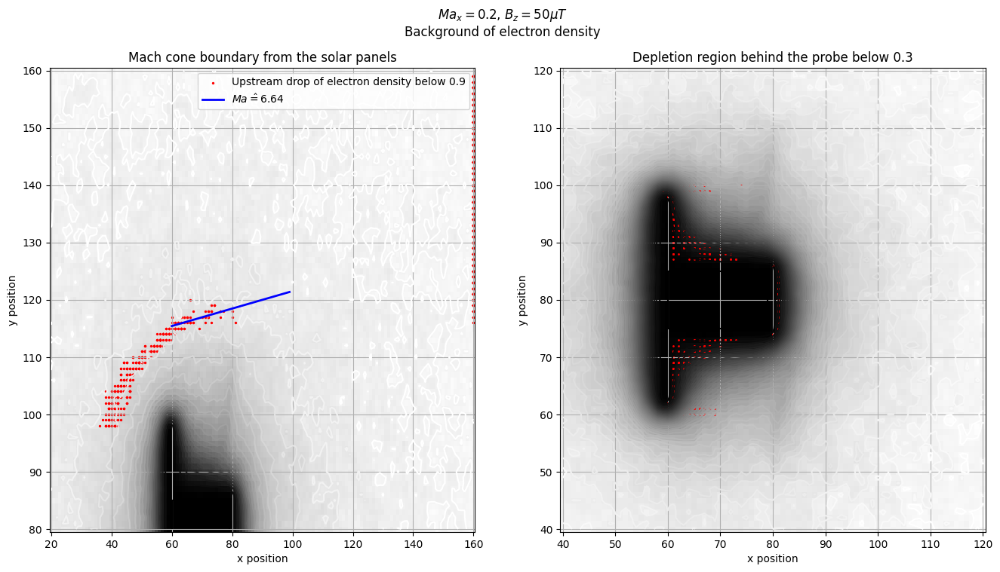

$Ma_x = 2.0$, $B_{x} = 50\mu T$ 0.42862996742653214 2.406014465055941
Based on the outer cone slope, Mach number is estimated to be 2.41


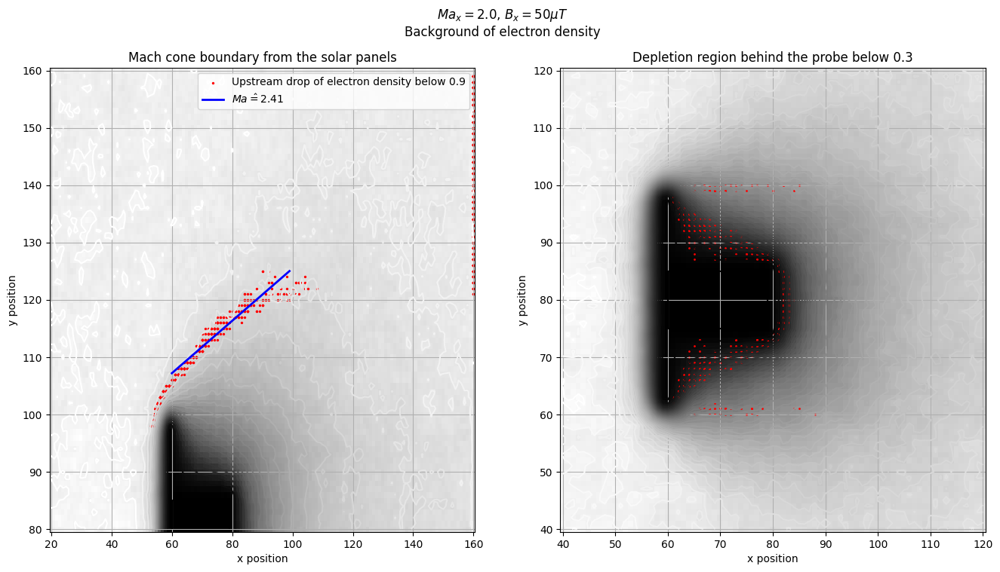

$Ma_x = 2.0$, $B_{x} = 0\mu T$ 0.3082674632023981 3.295889540082173
Based on the outer cone slope, Mach number is estimated to be 3.30


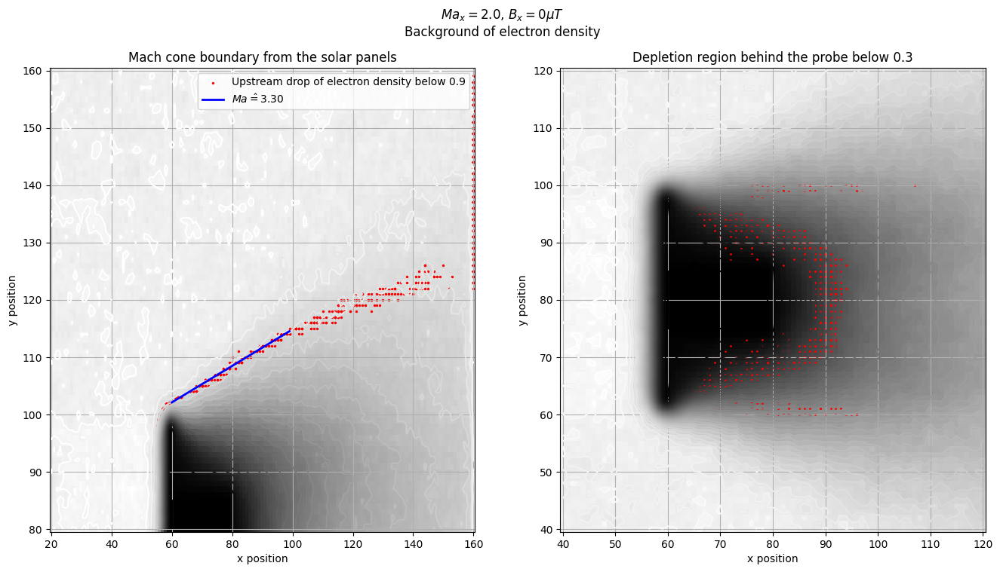

$Ma_x = 0.2$, $B_{x} = 50\mu T$ 0.17492423630442358 5.746019153388816
Based on the outer cone slope, Mach number is estimated to be 5.75


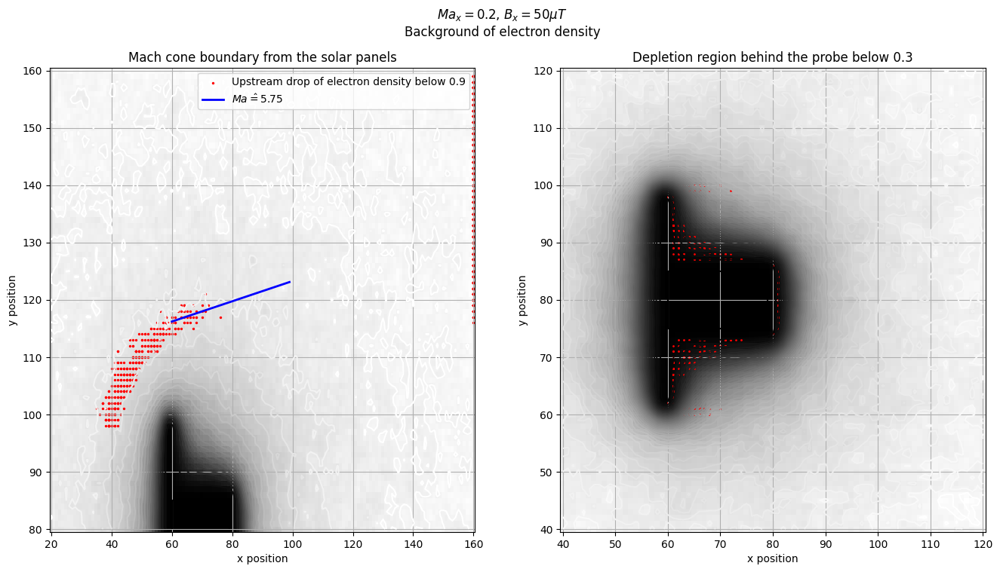

$Ma_x = 6.4$, $B_{x} = 50\mu T$ 0.18815047197040252 5.346383395151212
Based on the outer cone slope, Mach number is estimated to be 5.35


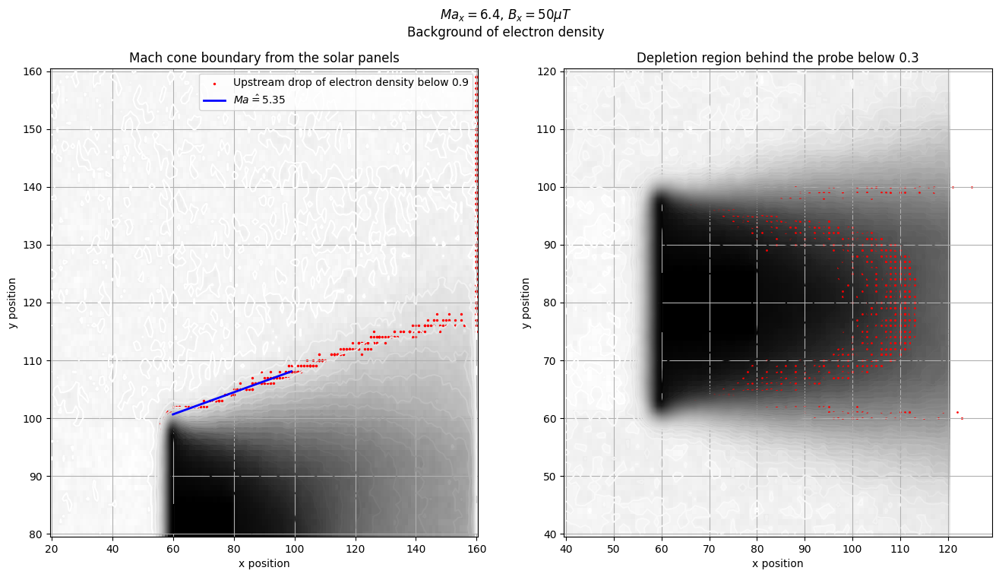

$Ma_x = 4.0$, $B_{x} = 0\mu T$ 0.3312703148110816 3.0746096628628647
Based on the outer cone slope, Mach number is estimated to be 3.07


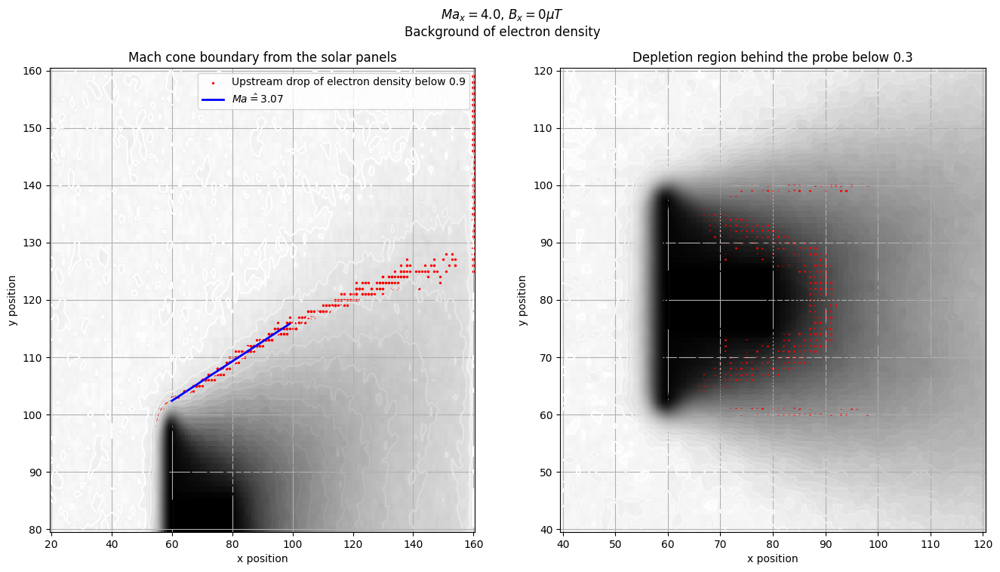

$Ma_x = 2.0$, $B_{z} = 50\mu T$ 0.3657691502053964 2.795891502153948
Based on the outer cone slope, Mach number is estimated to be 2.80


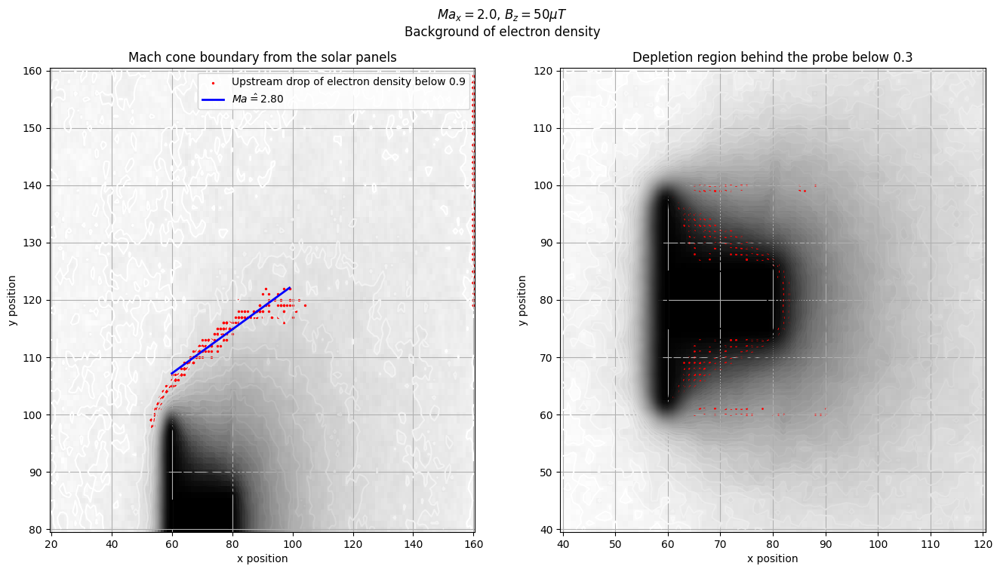

$Ma_x = 6.4$, $B_{x} = 0\mu T$ 0.2150199786642026 4.686761536097245
Based on the outer cone slope, Mach number is estimated to be 4.69


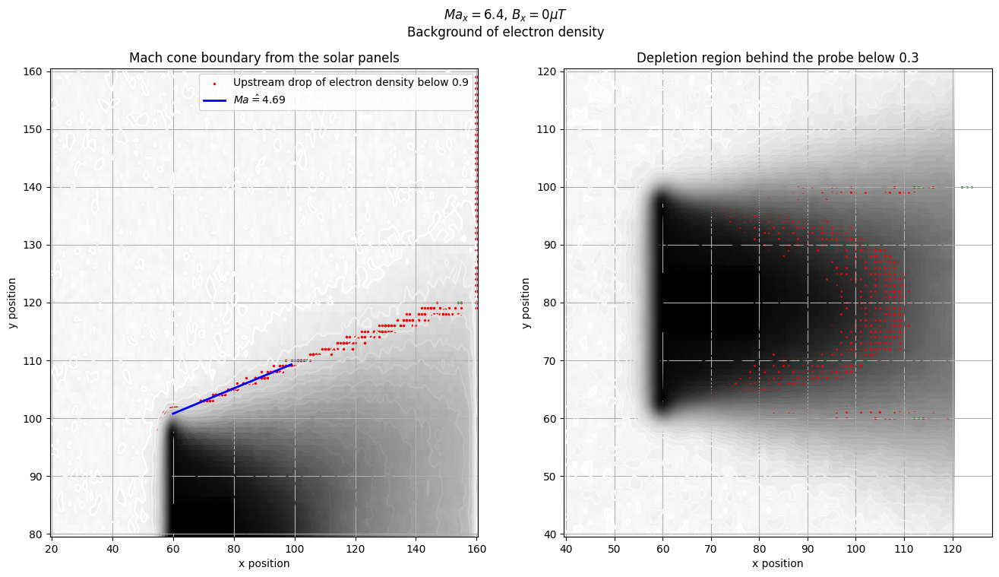

In [11]:
for name in dfs:
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    Bdir = re.search("^.*B(.)_.*", name).group(1)
    Ma = re.search("^.*_Ma(\d+\.?\d*)_.*$", name).group(1)
    Bmag = re.search("^.*_(\d+\.?\d*)uT.*", name).group(1)
    label = f"$Ma_x = {Ma}$, $B_{{{Bdir}}} = {Bmag}\\mu T$"

    plt.suptitle(label + "\nBackground of electron density")
    outerCone(dfs[name], axs[0], "nd1p", mode=1, N_average=4, np_boundary=0.9, background_steps=20)
    innerCone(dfs[name], axs[1], "nd1p", background_steps=40)
    plt.show()

### Electron density drop below 0.95

| True Ma | $B_x (\mu T)$ | $\alpha$ | calculated Ma |
| --- | --- | --- | --- |
| 2.0 | 0 | 0.392 | 2.17 |
| 2.0 | 50 | 0.607 | 1.75 |
| 2.0 | 70 | 0.619 | 1.72 |
| 2.0 | 100 | 0.63 | 1.7 |
| 2.0 | 50 $(B_z)$ | 0.529 | 1.98 |
| 4.0 | 0 | 0.414 | 2.49 |
| 4.0 | 50 | 0.392 | 2.17 |
| 6.4 | 0 | 0.256 | 3.95 |
| 6.4 | 50 | 0.233 | 4.33 |
| 6.4 | 50 $(B_z)$ | 0.263 | 3.85 |

### Electric potential drop below 0.9

| True Ma | $B_x (\mu T)$ | $\alpha$ | calculated Ma |
| --- | --- | --- | --- |
| 2.0 | 0 | 0.308 | 3.3 |
| 2.0 | 50 | 0.43 | 2.41 |
| 2.0 | 70 | 0.44 | 2.35 |
| 2.0 | 100 | 0.44 | 2.37 |
| 2.0 | 50 $(B_z)$ | 0.366 | 2.8 |
| 4.0 | 0 | 0.331 | 3.07 |
| 4.0 | 50 | 0.308 | 3.3 |
| 6.4 | 0 | 0.215 | 4.69 |
| 6.4 | 50 | 0.188 | 5.35 |
| 6.4 | 50 $(B_z)$ | 0.201 | 5 |

